# Осложнения



# ML-модель для предсказания типа операции

**Задача:** разработать модель машинного обучения, которая будет предсказывать необходимость проведения одной из четырёх операций на основе представленных данных.

**Целевой признак (тип операции):**

- Радикальная операция

- Паллиативная 1 с искусственным кровообращением (ИК)

- Паллиативная 2 без ИК

- Паллиативная миниинвазивная без ИК

**Условия выполнения:**

- Деление на трейн и тест 70/30, stratified.

- Random state - 654321.

- Метрика - F1 Macro.

- Где много пропусков, возможно, нули.

- Метрики на train и test не должны сильно отличаться.

# Описание данных

Дано два датасета:

- **TOF_name_type_procedure.xlsx** - вспомогательный датасет, содержащий только названия признаков.

- **Base_TOF.xlsx** - основной датасет, на котором будет проводиться анализ и тестирование модели.

Датасет содержит 24 признака, включающих:

+ `год` - год поступления пациента;
+ `пол` - пол пациента;
+ `возраст` - возраст пациента;
+ `возрастные_группы` - категории по возрасту: младше/старше 75;
+ `дата_поступления` - дата поступления пациента;
+ `фк_стенокардии` - класс стенокардии (от 1 до 4);
+ `курение` - курит пациент или нет;
+ `аг` - факт наличия артериальной гипертензии;
+ `типы_сд` - типы сахарного диабета(1 - инсулиннонезависимый, 2 - инсулиннозависимый, 0 - отсутствует);
+ `наличие_сд` - наличие сахарного диабета;
+ `имт` - индекс массы тела, кг/м2;
+ `степень_имт` - категории массы тела(от 1 до 4),
+ `охс` - уровень общего холестерина;
+ `лпнп` - уровень липопротеина низкой плотности;
+ `креатинин` - уровень креатинина;
+ `скф` - скорость клубочковой фильтрации(функциональный показатель почек) - количество мл крови, которые почки фильтруют за минуту;
+ `хбп` - наличие хронической болезни почек;
+ `чкв_анамнез` - информация из анамнеза о чрезкожном коронарном вмещательстве (есть/нет);
+ `мфа` - мультифокальный атеросклероз;
+ `пикс` - наличие постинфарктного кардиосклероза;
+ `ритм_экг` - характер сердечного ритма:
    + 0 - синусовый,
    + 1 - фибрилляция предсердий,
    + 2 - электрокардиостимулятор? экстрасистология;
+ `офв_лж` - фракция выброса левого желудочка, %;
+ `сужение_вса_более_70%` - отражает факт сильного сужения внутренней сонной артерии;
+ `сужение_магистр_артерий_нк_более_70` - есть ли сужение магистральных артерий нижних конечностей более чем на 70%;
+ `поражение_ствола_лка_более_50%` - есть ли стеноз (сужение) ствола левой коронарной артерии (ЛКА) более чем на 50%;
+ `поражение_пмжв` - наличие стеноза (поражения) передней межжелудочковой ветви (ПМЖВ);
+ `поражение_1_мак` - количество пораженных магистралных коронарных артерий;
+ `поражение_2_мак` - ;
+ `поражение_3_мак` - ;
+ `еuroscore1_абс` - ;
+ `еuroscore1` - оценка степени риска по шкале еuroscore1;
+ `степени_еuroscore` - категоризация по степеням риска;
+ `еuroscore2` - оценка степени риска по шкале еuroscore2,
+ `дата_операции` - дата проведения операции;
+ `акш` - факт проведения аортокоронарного шунтирования;
+ `есть_ик` - факт проведения искусственного кровообращения;
+ `стентирование_ка` - факт проведения стентирования коронарной артерии;
+ `акш_и_тмлр` - факт проведения шунтирования совместно с транслюминальной малоконтактной реконструкцией;
+ `вабк` - наличие внутриаортальной баллонной контрпульсации;
+ `стентирование_ствола_лка` - факт проведения стентирования ствола левой коронарной артерии;
+ `число_стентированных_ка` - количество стентированных коронарных артерий;
+ `число_стентов` - число стентов;
+ `шунтирование_пмжв` - наличие аортокоронарного шунта на переднюю межжелудочковую ветвь;
+ `мкш_и_пмжв` - наличие шунтирования (коронарного) на переднюю межжелудочковую ветвь (ПМЖВ) с использованием мостика или моста коронарного шунта (МКШ),
+ `продолжительность_ик` - время поддержания искусственного кровообращения, мин.;
+ `число_шунтов` - количество шунтов;
+ `акш_анамнез` - информация из анамнеза о факте проведения коронарного шунтирования;
+ `осложнения` - целевой признак (есть/нет).

## Раздел 1. Загрузка данных

### 1.1. Загрузка библиотек

Устанавливаем и импортируем библиотеки, считываем данные в датафрейм и сохраняем в переменную.

In [1]:
# Устанавливаем библиотеки
%%capture
!pip install missingno
!pip install phik
!pip install catboost
!pip install lightgbm

In [2]:
# =============================================================
# Библиотеки для работы с данными и научных вычислений
# =============================================================
import pandas as pd
import numpy as np
import re
import math

# ==============================================================
# Библиотеки для визуализации данных
# ==============================================================
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
import missingno as msno

# ==============================================================
# Библиотеки для машинного обучения и моделей
# ==============================================================
from sklearn.model_selection import train_test_split, RandomizedSearchCV
# from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder,MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.metrics import (f1_score,
                             confusion_matrix,
                             ConfusionMatrixDisplay)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from imblearn.pipeline import Pipeline
from sklearn.linear_model import BayesianRidge
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier

# =============================================================
# Библиотеки для корреляционного анализа
# =============================================================
import phik
from phik import phik_matrix
from phik.report import plot_correlation_matrix

# =============================================================
# Работа с предупреждениями
# =============================================================
import warnings
warnings.filterwarnings('ignore')


### 1.2. Константы

In [3]:
# Константы
RANDOM_STATE = 654321
TEST_SIZE = 0.3

### 1.3. Функции

### 1.4. Загрузка данных

In [4]:
df = pd.read_excel("/content/drive/MyDrive/alpha/Осложнения/Операции для ИИ адаптивный.xlsx")
df

,Год,"Пол (1-мужской, 2 - женский)",Возраст,"Возрастные группы 0-меньше 75, 1 -больше 75",Дата поступления,"ФК стенокардии 1,2,3,4",Курение_1,АГ,"типы СД 2 типа(0-нет, 1-ИНСД, 2-ИЗСД)","Наличие СД 0-нет, 1 есть",...,"ВАБК 0-нет, 1- да","стентированиестволаЛКА 0-нет, 1 да",Число стентированных КА,Число стентов,"Шунтирование ПМЖВ 0-не было, 1 - было","МКШ с ПМЖВ 0-нет, 1 - да","Время ИК, мин","Число шунтов, n","АКШ в анамнезе 0-нет, 1 - да",Осложнения
0,2021,1,74.84,0,2021-05-24T00:00:00+00:00,3,1,1,0,0,...,0,0,0,0,1,1,55,3,0,1
1,2021,1,73.63,0,2021-06-08T00:00:00+00:00,2,1,1,0,0,...,0,0,0,0,1,1,0,5,0,1
2,2021,1,68.15,0,2021-02-24T00:00:00+00:00,4,0,1,1,1,...,0,0,0,0,1,0,0,2,0,0
3,2021,1,73.11,0,2021-02-10T00:00:00+00:00,3,0,1,0,0,...,0,0,0,0,1,1,63,3,0,1
4,2019,1,67.06,0,2019-08-26T00:00:00+00:00,3,0,1,1,1,...,0,0,0,0,1,1,122,3,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,2020,1,56.44,0,2020-08-10T00:00:00+00:00,3,0,1,0,0,...,0,0,0,0,0,0,130,0,0,0
2228,2019,1,66.32,0,2019-09-16T00:00:00+00:00,3,1,1,0,0,...,0,0,0,0,0,0,30,1,0,0
2229,2021,1,66.69,0,2021-04-16T00:00:00+00:00,3,0,1,1,1,...,0,0,0,0,0,0,98,2,0,0
2230,2020,2,71.84,0,2020-04-09T00:00:00+00:00,4,0,1,1,1,...,0,0,0,0,0,0,50,3,0,0


Данные загрузились, дополнительных действий не требуется. Изучим общую информацию:

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2232 entries, 0 to 2231
Data columns (total 48 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   Год                                          2232 non-null   int64         
 1   Пол (1-мужской, 2 - женский)                 2232 non-null   int64         
 2   Возраст                                      2232 non-null   float64       
 3   Возрастные группы 0-меньше 75, 1 -больше 75  2232 non-null   int64         
 4   Дата поступления                             2232 non-null   object        
 5   ФК стенокардии 1,2,3,4                       2232 non-null   int64         
 6   Курение_1                                    2232 non-null   int64         
 7   АГ                                           2232 non-null   int64         
 8   типы СД 2 типа(0-нет, 1-ИНСД, 2-ИЗСД)        2232 non-null   int64         
 9

Структура датасета:
+ 2232 наблюдения;
+ 48 признаков включая целевой;
+ по типу данных - int, float, datetime, object.

Рассмотрим таблицу с точки зрения пропусков:

In [6]:
%matplotlib inline

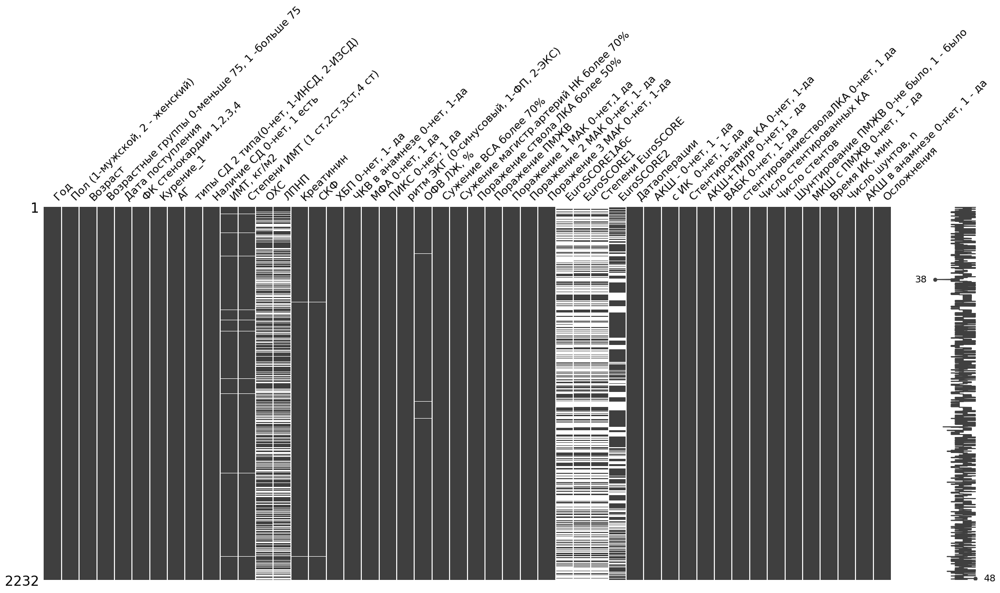

In [7]:
msno.matrix(df);

In [8]:
display(
    pd.DataFrame({
        "Пропущено_строк": df.isna().sum(),
        "% пропусков": round(df.isna().mean() * 100, 1)

    }).query('Пропущено_строк > 0')
    .sort_values("Пропущено_строк", ascending=False)
    .style.background_gradient('coolwarm')
)

,Пропущено_строк,% пропусков
EuroSCORE1Абс,1454,65.100000
EuroSCORE1,1421,63.700000
Степени EuroSCORE,1421,63.700000
ЛПНП,817,36.600000
EuroSCORE2,794,35.600000
ОХС,794,35.600000
"ИМТ, кг/м2",25,1.100000
"Степени ИМТ (1 ст,2ст,3ст,4 ст)",25,1.100000
"ОФВ ЛЖ, %",10,0.400000
СКФ,3,0.100000


Вывод:
+ Таблица состоит из 2232 строки и 48 столбцов;
+ Данные имеют различные типы числовые(int/float), даты/время(datetime, object);
+ В 11 столбцах наблюдаем пропуски:
    + небольшие(не больше 1,2%);
    + средние(36-37%);
    + большое количество пропусков(64-65%);
+ При этом пропуски взаимосвязанны у признаков:
    + `ИМТ` - `степени ИМТ`;
    + `ОХС` - `ЛПНП`;
    + `Креатинин` - `СКФ`;
    + `EuroSCORE1Абс` - `EuroSCORE1` - `Степени EuroSCORE`;
+ Наименования столбцов содержат кириллицу, пробелы и другие символы, разные регистры;
+ Имеются проблемы с неверным типом данных(н-р, `дата поступления` - object)

## Раздел 2. Предобработка данных

### 2.2. Анализ дубликатов

In [9]:
# Проверим датасет на дубликаты
print(f"Количество строк-дубликатов: {df.duplicated().sum()}")

Количество строк-дубликатов: 0


### 2.1. Корректировка наименований столбцов

In [10]:
df.columns = [
    'год',
    'пол',
    'возраст',
    'возрастные_группы',
    'дата_поступления',
    'фк_стенокардии',
    'курение',
    'аг',
    'типы_сд',
    'наличие_сд',
    'имт',
    'степень_имт',
    'охс',
    'лпнп',
    'креатинин',
    'скф',
    'хбп',
    'чкв_анамнез',
    'мфа',
    'пикс',
    'ритм_экг',
    'офв_лж',
    'сужение_вса_более_70%',
    'сужение_магистр_артерий_нк_более_70%',
    'поражение_ствола_лка_более_50%',
    'поражение_пмжв',
    'поражение_1_мак',
    'поражение_2_мак',
    'поражение_3_мак',
    'еuroscore1_абс',
    'еuroscore1',
    'степени_еuroscore',
    'euroscore2',
    'дата_операции',
    'акш',
    'есть_ик',
    'стентирование_ка',
    'акш_и_тмлр',
    'вабк',
    'стентирование_ствола_лка',
    'число_стентированных_ка',
    'число_стентов',
    'шунтирование_пмжв',
    'мкш_и_пмжв',
    'продолжительность_ик',
    'число_шунтов',
    'акш_анамнез',
    'осложнения'
]
df.head(2)

,год,пол,возраст,возрастные_группы,дата_поступления,фк_стенокардии,курение,аг,типы_сд,наличие_сд,...,вабк,стентирование_ствола_лка,число_стентированных_ка,число_стентов,шунтирование_пмжв,мкш_и_пмжв,продолжительность_ик,число_шунтов,акш_анамнез,осложнения
0,2021,1,74.84,0,2021-05-24T00:00:00+00:00,3,1,1,0,0,...,0,0,0,0,1,1,55,3,0,1
1,2021,1,73.63,0,2021-06-08T00:00:00+00:00,2,1,1,0,0,...,0,0,0,0,1,1,0,5,0,1


### Разделение выборки

Разделим нашу выборку на обучающую и тестовую и отложим второю для апробации финальной модели.

In [11]:
df_train, df_test = train_test_split(
    df,
    test_size=TEST_SIZE,
    stratify=df['осложнения'],
    random_state=RANDOM_STATE
)

In [12]:
print('Размер обучающей выборки:', df_train.shape)
print('Размер тестовой выборки:', df_test.shape)
print('Распределение таргета обучающей выборки:',
      df_train['осложнения'].value_counts(normalize=True))
print('Распределение таргета тестовой выборки:',
      df_test['осложнения'].value_counts(normalize=True))

Размер обучающей выборки: (1562, 48)
Размер тестовой выборки: (670, 48)
Распределение таргета обучающей выборки: осложнения
0    0.972471
1    0.027529
Name: proportion, dtype: float64
Распределение таргета тестовой выборки: осложнения
0    0.973134
1    0.026866
Name: proportion, dtype: float64


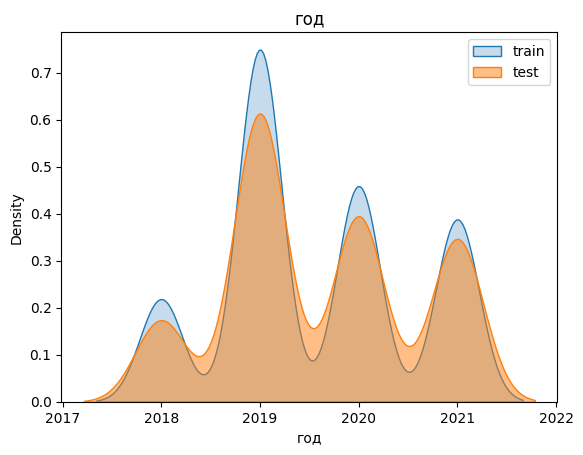

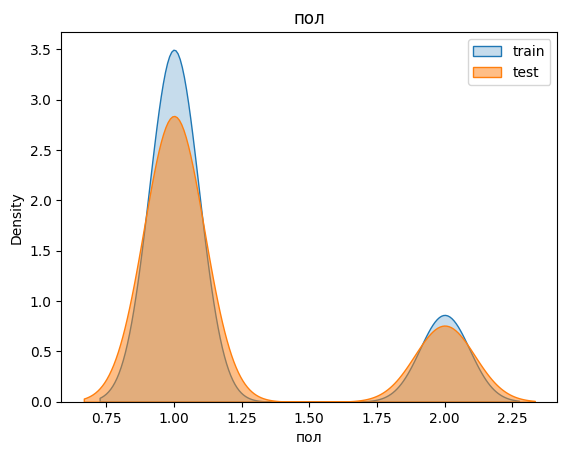

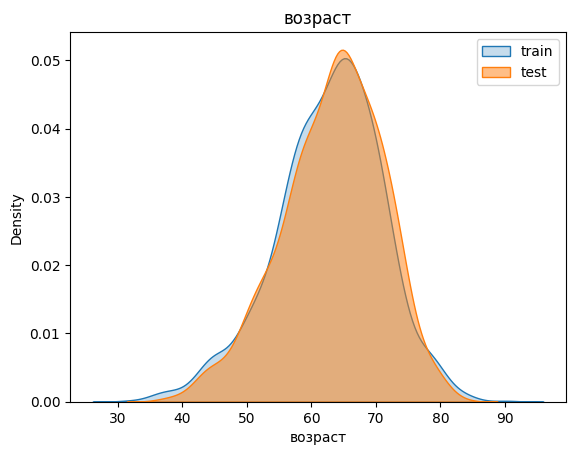

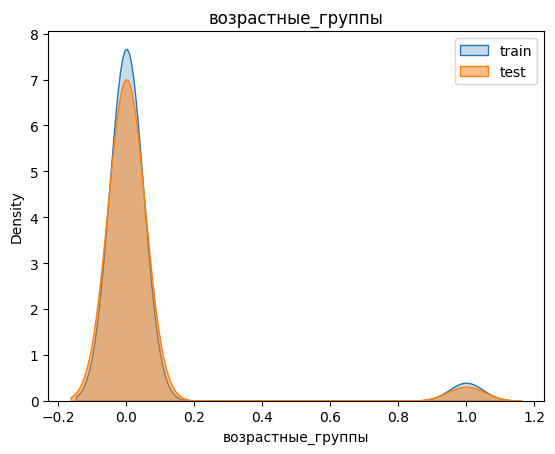

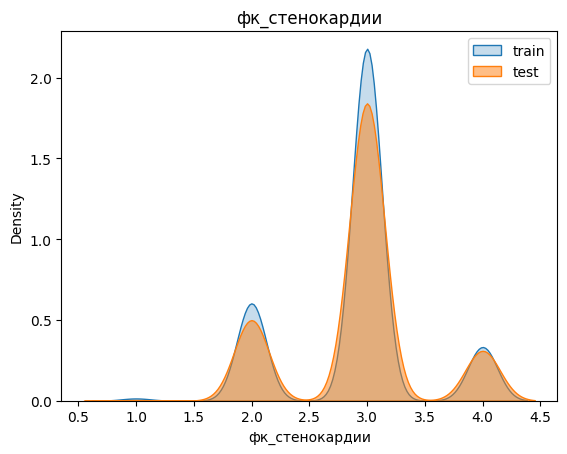

...

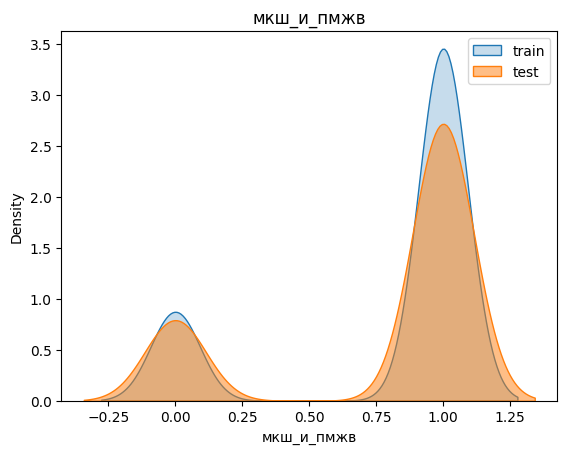

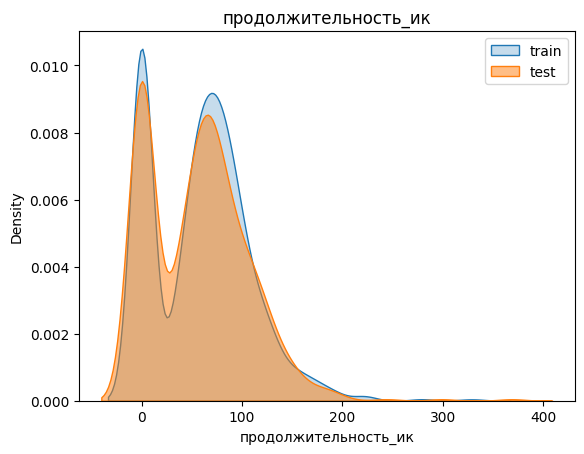

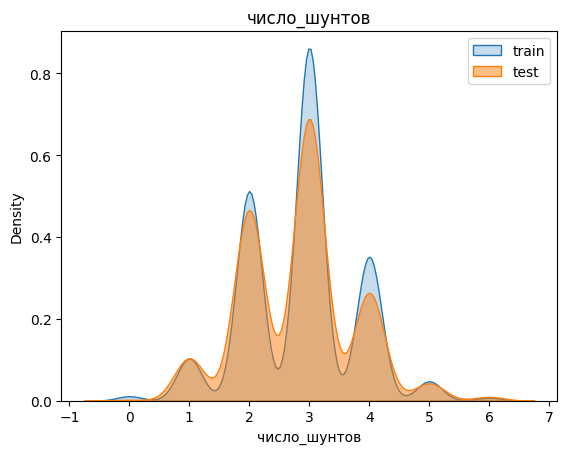

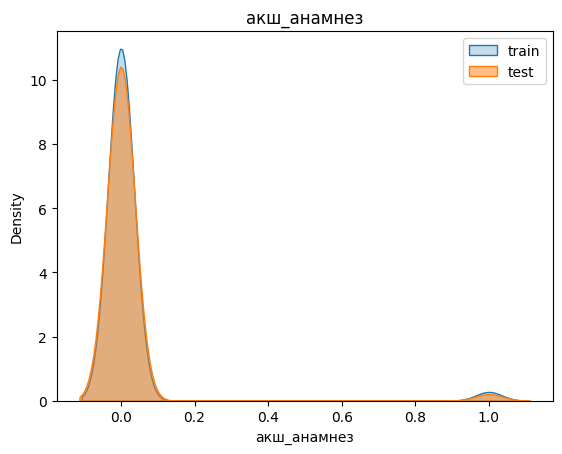

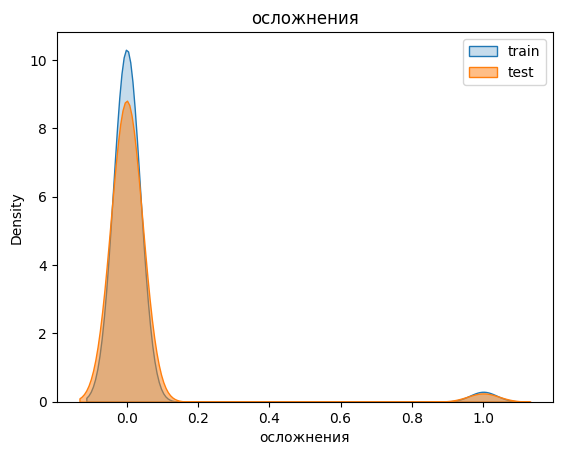

In [13]:
for col in df.drop('дата_поступления', axis=1).columns.tolist():
    sns.kdeplot(df_train[col], label='train', fill=True)
    sns.kdeplot(df_test[col], label='test', fill=True, alpha=0.5)
    plt.title(col)
    plt.legend()
    plt.show()

Подвыборки сформированы корректно, дальше предобработку и исследование будем проводить только с обучающей. Все изменения данных зафиксируем в конечном пайплайне.

In [14]:
df_train.columns

Index(['год', 'пол', 'возраст', 'возрастные_группы', 'дата_поступления',
       'фк_стенокардии', 'курение', 'аг', 'типы_сд', 'наличие_сд', 'имт',
       'степень_имт', 'охс', 'лпнп', 'креатинин', 'скф', 'хбп', 'чкв_анамнез',
       'мфа', 'пикс', 'ритм_экг', 'офв_лж', 'сужение_вса_более_70%',
       'сужение_магистр_артерий_нк_более_70%',
       'поражение_ствола_лка_более_50%', 'поражение_пмжв', 'поражение_1_мак',
       'поражение_2_мак', 'поражение_3_мак', 'еuroscore1_абс', 'еuroscore1',
       'степени_еuroscore', 'euroscore2', 'дата_операции', 'акш', 'есть_ик',
       'стентирование_ка', 'акш_и_тмлр', 'вабк', 'стентирование_ствола_лка',
       'число_стентированных_ка', 'число_стентов', 'шунтирование_пмжв',
       'мкш_и_пмжв', 'продолжительность_ик', 'число_шунтов', 'акш_анамнез',
       'осложнения'],
      dtype='object')

### 2.3. Уникальные значения признаков

In [15]:
for col in df_train.columns:
    print('=' * 80)
    print(f'Количество уникальных значений признака {col} - {len(df_train[col].unique())}')
    print('Значения: ')
    print(df_train[col].unique())

Количество уникальных значений признака год - 4
Значения: 
[2020 2021 2018 2019]
Количество уникальных значений признака пол - 2
Значения: 
[1 2]
Количество уникальных значений признака возраст - 1218
Значения: 
[54.72 36.15 63.61 ... 51.86 82.01 61.91]
Количество уникальных значений признака возрастные_группы - 2
Значения: 
[0 1]
Количество уникальных значений признака дата_поступления - 616
Значения: 
['2020-03-04T00:00:00+00:00' '2021-05-21T00:00:00+00:00'
 '2021-01-14T00:00:00+00:00' '2020-01-23T00:00:00+00:00'
 '2018-11-13T00:00:00+00:00' '2019-12-17T00:00:00+00:00'
 '2019-09-19T00:00:00+00:00' '2019-09-09T00:00:00+00:00'
 '2020-06-18T00:00:00+00:00' '2019-04-15T00:00:00+00:00'
 '2020-10-16T00:00:00+00:00' '2019-04-19T00:00:00+00:00'
 '2019-12-05T00:00:00+00:00' '2019-12-09T00:00:00+00:00'
 '2020-08-18T00:00:00+00:00' '2021-02-09T00:00:00+00:00'
 '2019-01-14T00:00:00+00:00' '2020-03-20T00:00:00+00:00'
 '2020-10-05T00:00:00+00:00' '2018-12-10T00:00:00+00:00'
 '2020-11-30T00:00:00+0

+ признак `акш` можно удалить, т.к. он состоит из одного значения, сообщающего, что всем пациентам было проведено аортокоронарное шунтирование;
+ аналогично поступим с признаками `стентирование_ствола_лка`, `число_стентированных_ка`, `число_стентов`;
+ 12 подкатегорий - наибольшее для категориальных данных, все количественные отличаются большим разнообразием, применим это для деление на категориальные и числовые признаки.

In [16]:
# df_train = df_train.drop(['акш',
#               'стентирование_ствола_лка',
#               'число_стентированных_ка',
#               'число_стентов'], axis=1)

Определим признаки на категориальные и количественные:

In [17]:
num_cols = [col for col in df_train.columns if len(df_train[col].unique()) > 12 and col not in ['дата_поступления',
                                                                                    'дата_операции']]
num_cols

['возраст',
 'имт',
 'охс',
 'лпнп',
 'креатинин',
 'скф',
 'офв_лж',
 'еuroscore1',
 'euroscore2',
 'продолжительность_ик']

In [18]:
cat_cols = [col for col in df_train.columns if col not in num_cols + ['дата_поступления',
                                                  'дата_операции',
                                                  'осложнения']]

In [19]:
len(num_cols + cat_cols) == df_train.shape[1] - 3

True

### Предобработка дат

Проблема с типом данных наблюдается только у датовой колонки `дата_поступления`.

In [20]:
df_train['дата_поступления'] = pd.to_datetime(df_train['дата_поступления']).dt.tz_localize(None)

Выделим из дат информацию, которая может пригодиться в построении модели:
+ время пребывания в клинике;
+ месяц, день, день недели операции

In [21]:
df_train['продолжительность_стационара'] = (df_train['дата_операции'] -
                                            df_train['дата_поступления']).dt.days
df_train['год_операции'] = df_train['дата_операции'].dt.year
df_train['год_поступления'] = df_train['дата_поступления'].dt.year
df_train['месяц_операции'] = df_train['дата_операции'].dt.month
df_train['день_операции'] = df_train['дата_операции'].dt.day
df_train['день_недели_операции'] = df_train['дата_операции'].dt.weekday

In [22]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1562 entries, 1649 to 318
Data columns (total 54 columns):
 #   Column                                Non-Null Count  Dtype         
---  ------                                --------------  -----         
 0   год                                   1562 non-null   int64         
 1   пол                                   1562 non-null   int64         
 2   возраст                               1562 non-null   float64       
 3   возрастные_группы                     1562 non-null   int64         
 4   дата_поступления                      1562 non-null   datetime64[ns]
 5   фк_стенокардии                        1562 non-null   int64         
 6   курение                               1562 non-null   int64         
 7   аг                                    1562 non-null   int64         
 8   типы_сд                               1562 non-null   int64         
 9   наличие_сд                            1562 non-null   int64         
 10  имт

In [23]:
df_train[df_train['год_поступления'] != df_train['год']]


,год,пол,возраст,возрастные_группы,дата_поступления,фк_стенокардии,курение,аг,типы_сд,наличие_сд,...,продолжительность_ик,число_шунтов,акш_анамнез,осложнения,продолжительность_стационара,год_операции,год_поступления,месяц_операции,день_операции,день_недели_операции
1758,2021,1,41.61,0,2020-12-24,3,0,1,0,0,...,95,2,0,0,1,2020,2020,12,25,4
2019,2021,1,65.75,0,2020-12-25,3,0,1,0,0,...,0,4,0,0,3,2020,2020,12,28,0
1142,2021,1,63.99,0,2020-12-28,3,0,1,0,0,...,106,3,0,0,1,2020,2020,12,29,1
1527,2021,1,46.74,0,2020-12-25,3,0,1,0,0,...,107,3,0,0,3,2020,2020,12,28,0


В этих строках наблюдаем несоответствия года поступления/операции и года. Возможно в *год* записывали год выписки пациента, поскольку в этих строках операция была проведена в конце года, а выписать могли уже в следующем году. Оставим *год_поступления*.

In [24]:
df_train = df_train.drop(['год',
                          'дата_поступления',
                          'дата_операции'], axis=1)

### Пропуски

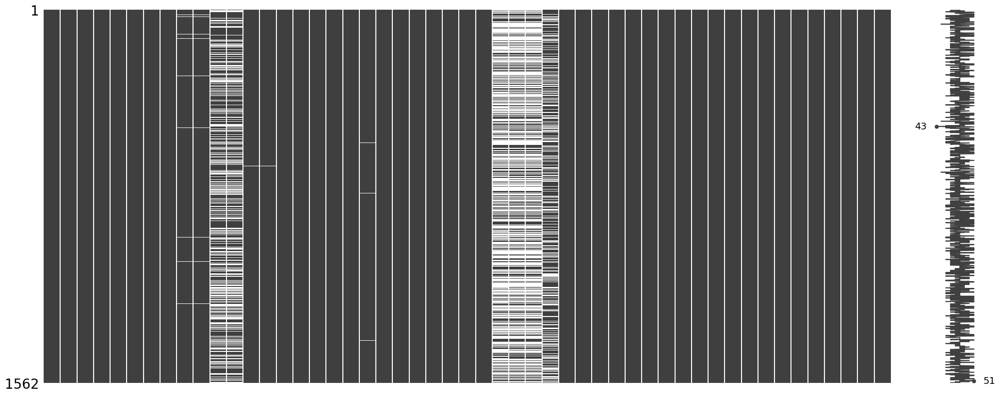

In [25]:
msno.matrix(df_train);

In [26]:
display(
    pd.DataFrame({
        "Пропущено_строк": df_train.isna().sum(),
        "% пропусков": round(df_train.isna().mean() * 100, 1)

    }).query('Пропущено_строк > 0')
    .sort_values("Пропущено_строк", ascending=False)
    .style.background_gradient('coolwarm')
)

,Пропущено_строк,% пропусков
еuroscore1_абс,995,63.700000
еuroscore1,972,62.200000
степени_еuroscore,972,62.200000
лпнп,588,37.600000
охс,572,36.600000
euroscore2,549,35.100000
имт,19,1.200000
степень_имт,19,1.200000
офв_лж,6,0.400000
скф,1,0.100000


По структуре пропусков видим, что некоторые признаки имеют пропуски в одинаковых строках:
+ `еuroscore1_абс`, `еuroscore1`, `степени_еuroscore` - из этого следует, что степени и абс относятся только к показателю `еuroscore1`;
+ `охс`, `лпнп`;
+ `имт`, `степень_имт`;
+ `креатинин`, `скф`.

In [27]:
df_train[df_train.notna().all(axis=1)][['еuroscore1',
          'еuroscore1_абс',
          'степени_еuroscore',
          'euroscore2']].describe()

,еuroscore1,еuroscore1_абс,степени_еuroscore,euroscore2
count,192.000000,192.000000,192.000000,192.000000
mean,2.331979,3.312500,1.182292,2.223854
std,1.172610,1.328799,0.413261,2.457549
min,1.510000,2.000000,1.000000,0.500000
25%,1.510000,2.000000,1.000000,0.907500
50%,1.960000,3.000000,1.000000,1.515000
75%,2.710000,4.000000,1.000000,2.560000
max,10.110000,8.000000,3.000000,20.730000


In [28]:
df_nan_info = pd.DataFrame({'NaN share': df_train.isna().sum()})
df_nan_info = df_nan_info[df_nan_info['NaN share'] != 0.0]
df_nan_info

,NaN share
имт,19
степень_имт,19
охс,572
лпнп,588
креатинин,1
скф,1
офв_лж,6
еuroscore1_абс,995
еuroscore1,972
степени_еuroscore,972


In [29]:
def mcar_test(data, predictor, feature):
    """
    Выполняет статистическую проверку пропущенных значений на принадлежность к типу MCAR.
    Использует t-тест для сравнения распределения feature между группами с пропущенными и существующими значениями predictor.

    Аргументы:
        data (pandas.DataFrame): Датасет с данными для анализа.
        predictor (str): Название столбца в data с пропущенными значениями (целевая переменная для теста MCAR).
        feature (str): Название признака, по которому сравниваются распределения между группами.

    Возвращает:
        float: p-value t-теста.
    """
    data_nans_in_feature = data[data[predictor].isna()]      # Все наблюдения в data с пропусками в predictor
    data_non_nans_in_feature = data[data[predictor].notna()]   # Все наблюдения в data без пропусков в predictor
    _, p_val, _ = ttest_ind(data_nans_in_feature[feature], data_non_nans_in_feature[feature])
    return p_val

In [30]:
from statsmodels.stats.weightstats import ttest_ind

In [31]:
p_values = []

for predictor in df_nan_info.index:
    p_val = mcar_test(df_train, predictor, 'осложнения')
    p_values.append(p_val)

df_nan_info['p-value'] = p_values
df_nan_info

,NaN share,p-value
имт,19,0.501349
степень_имт,19,0.501349
охс,572,0.810777
лпнп,588,0.952458
креатинин,1,0.866450
скф,1,0.866450
офв_лж,6,0.679899
еuroscore1_абс,995,0.844891
еuroscore1,972,0.938522
степени_еuroscore,972,0.938522


### Расчет euroscore

In [32]:
df_train.columns

Index(['пол', 'возраст', 'возрастные_группы', 'фк_стенокардии', 'курение',
       'аг', 'типы_сд', 'наличие_сд', 'имт', 'степень_имт', 'охс', 'лпнп',
       'креатинин', 'скф', 'хбп', 'чкв_анамнез', 'мфа', 'пикс', 'ритм_экг',
       'офв_лж', 'сужение_вса_более_70%',
       'сужение_магистр_артерий_нк_более_70%',
       'поражение_ствола_лка_более_50%', 'поражение_пмжв', 'поражение_1_мак',
       'поражение_2_мак', 'поражение_3_мак', 'еuroscore1_абс', 'еuroscore1',
       'степени_еuroscore', 'euroscore2', 'акш', 'есть_ик', 'стентирование_ка',
       'акш_и_тмлр', 'вабк', 'стентирование_ствола_лка',
       'число_стентированных_ка', 'число_стентов', 'шунтирование_пмжв',
       'мкш_и_пмжв', 'продолжительность_ик', 'число_шунтов', 'акш_анамнез',
       'осложнения', 'продолжительность_стационара', 'год_операции',
       'год_поступления', 'месяц_операции', 'день_операции',
       'день_недели_операции'],
      dtype='object')

In [33]:
import math

'''  Функия расчитывающая euroscore, на основе имеющихся признаков
  https://medsoftpro.ru/kalkulyatory/euroscore-2.html'''

def calc_euroscore(row):
    koeff = 0
    # Возраст
    if int(row['возраст']) <= 60:
        koeff += 0.0285181
    else:
        koeff += (int(row['возраст']) - 59) * 0.0285181

    # Пол
    if row['пол'] == 2:
        koeff += 0.2196434

    # Инсулинозависимый сахарный диабет
    if row['типы_сд'] == 2:
        koeff += 0.3542749

    # Нарушение функции почек
    if 51 <= row['скф'] <= 85:
        koeff += 0.303553
    elif row['скф'] <= 50:
        koeff += 0.8592256

    # Стенокардия 4 класса
    if row['фк_стенокардии'] == 4:
        koeff += 0.2226147

    # Экстракардиальная артериопатия
    if row['сужение_вса_более_70%'] or row['сужение_магистр_артерий_нк_более_70%']:
        koeff += 0.5360268

    # Предыдущая операция на сердце
    if row['акш_анамнез']:
        koeff += 1.118599

    # Фракция выброса левого желудочка
    if 31 <= row['офв_лж'] <= 50:
        koeff += 0.3150652
    elif 21 <= row['офв_лж'] <= 30:
        koeff += 0.8084096
    elif row['офв_лж'] <= 20:
        koeff += 0.9346919

    # Недавний инфаркт миокарда(в признаке не отражен временной факт):
    if row['пикс']:
        koeff += 0.1528943

    # Экстренность
    if row['продолжительность_стационара'] <= 0:
        koeff += 1.362947
    # elif row['продолжительность_стационара'] <= 1:
    #     koeff += 0.7039121
    elif row['продолжительность_стационара'] <= 2:
        koeff += 0.3174673

    # Объем вмешательства
    elif row['акш'] == 0 and row['мкш_и_пмжв'] == 1:
        koeff += 0.0062118  # Изолированная крупная процедура без АКШ
    elif (row['акш'] == 1 and row['акш_и_тмлр'] == 1) or \
     (row['акш'] == 1 and row['мкш_и_пмжв'] == 1):
        koeff += 0.5521478  # Две основные процедуры
    elif row['акш_и_тмлр'] == 1 and row['мкш_и_пмжв'] == 1:
        koeff += 0.9724533  # Три и более крупных процедур

    y = koeff - 5.324537

    return (100*math.e**y)/(1+math.e**y)


In [34]:
df_train['euroscore_calc'] = df_train.apply(calc_euroscore, axis=1)

In [35]:
df_train[df_train.notna().all(axis=1)][['еuroscore1',
          'еuroscore1_абс',
          'степени_еuroscore',
          'euroscore2',
          'euroscore_calc']].describe()

,еuroscore1,еuroscore1_абс,степени_еuroscore,euroscore2,euroscore_calc
count,192.000000,192.000000,192.000000,192.000000,192.000000
mean,2.331979,3.312500,1.182292,2.223854,1.788522
std,1.172610,1.328799,0.413261,2.457549,1.347823
min,1.510000,2.000000,1.000000,0.500000,0.597246
25%,1.510000,2.000000,1.000000,0.907500,0.923938
50%,1.960000,3.000000,1.000000,1.515000,1.389273
75%,2.710000,4.000000,1.000000,2.560000,2.068509
max,10.110000,8.000000,3.000000,20.730000,11.667408


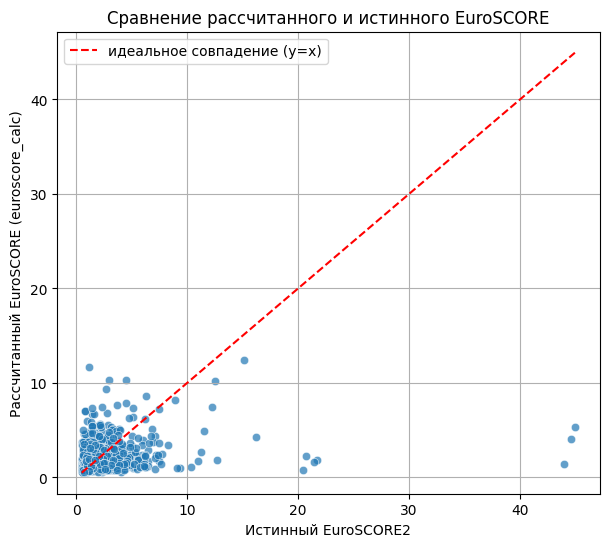

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(7, 6))
sns.scatterplot(x='euroscore2', y='euroscore_calc', data=df_train, alpha=0.7)
plt.plot([df_train['euroscore2'].min(), df_train['euroscore2'].max()],
         [df_train['euroscore2'].min(), df_train['euroscore2'].max()],
         color='red', linestyle='--', label='идеальное совпадение (y=x)')
plt.xlabel('Истинный EuroSCORE2')
plt.ylabel('Рассчитанный EuroSCORE (euroscore_calc)')
plt.title('Сравнение рассчитанного и истинного EuroSCORE')
plt.legend()
plt.grid(True)
plt.show()


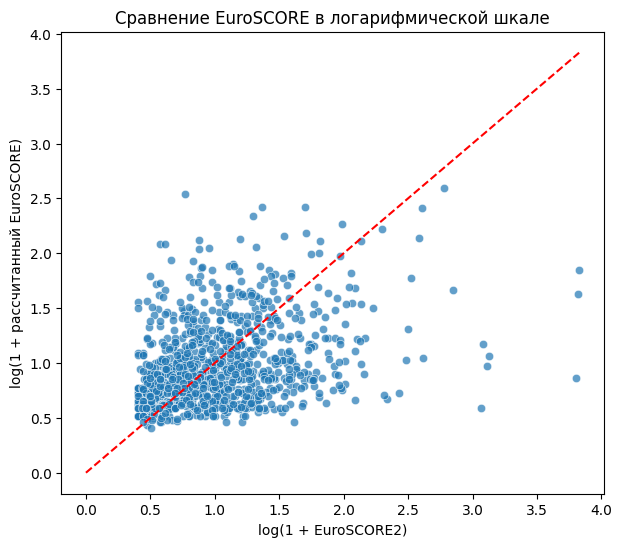

In [37]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7, 6))
sns.scatterplot(
    x=np.log1p(df_train['euroscore2']),
    y=np.log1p(df_train['euroscore_calc']),
    alpha=0.7
)
plt.plot(
    [0, np.log1p(df_train[['euroscore2', 'euroscore_calc']].max().max())],
    [0, np.log1p(df_train[['euroscore2', 'euroscore_calc']].max().max())],
    color='red', linestyle='--'
)
plt.xlabel('log(1 + EuroSCORE2)')
plt.ylabel('log(1 + рассчитанный EuroSCORE)')
plt.title('Сравнение EuroSCORE в логарифмической шкале')
plt.show()


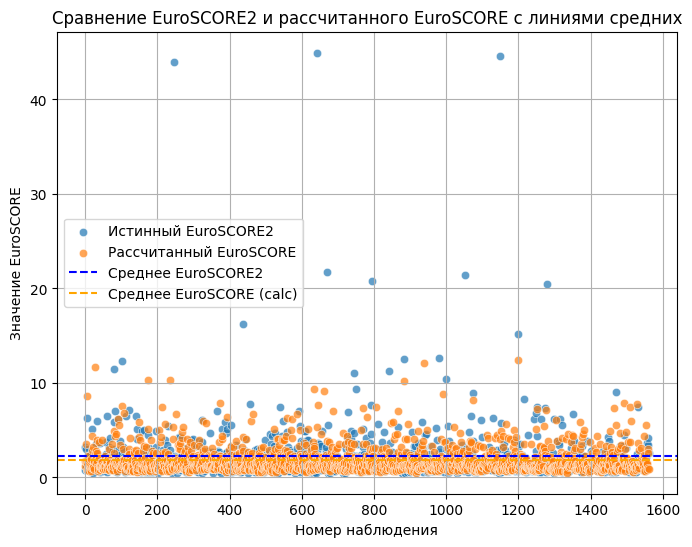

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))

sns.scatterplot(x=range(len(df_train)), y='euroscore2', data=df_train, label='Истинный EuroSCORE2', alpha=0.7)
sns.scatterplot(x=range(len(df_train)), y='euroscore_calc', data=df_train, label='Рассчитанный EuroSCORE', alpha=0.7)

# Средние линии
plt.axhline(df_train['euroscore2'].mean(), color='blue', linestyle='--', label='Среднее EuroSCORE2')
plt.axhline(df_train['euroscore_calc'].mean(), color='orange', linestyle='--', label='Среднее EuroSCORE (calc)')

plt.xlabel('Номер наблюдения')
plt.ylabel('Значение EuroSCORE')
plt.title('Сравнение EuroSCORE2 и рассчитанного EuroSCORE с линиями средних')
plt.legend()
plt.grid(True)
plt.show()



Рассчитанный показатель имеет в среднем занижает оценку и не позволяет повторять наблюдения с большими выбросами. Но ввиду того, что оригинальный показатель имеет большое количество пропусков, добавим и исследуем синтезированный признак.

In [39]:
df_train.columns

Index(['пол', 'возраст', 'возрастные_группы', 'фк_стенокардии', 'курение',
       'аг', 'типы_сд', 'наличие_сд', 'имт', 'степень_имт', 'охс', 'лпнп',
       'креатинин', 'скф', 'хбп', 'чкв_анамнез', 'мфа', 'пикс', 'ритм_экг',
       'офв_лж', 'сужение_вса_более_70%',
       'сужение_магистр_артерий_нк_более_70%',
       'поражение_ствола_лка_более_50%', 'поражение_пмжв', 'поражение_1_мак',
       'поражение_2_мак', 'поражение_3_мак', 'еuroscore1_абс', 'еuroscore1',
       'степени_еuroscore', 'euroscore2', 'акш', 'есть_ик', 'стентирование_ка',
       'акш_и_тмлр', 'вабк', 'стентирование_ствола_лка',
       'число_стентированных_ка', 'число_стентов', 'шунтирование_пмжв',
       'мкш_и_пмжв', 'продолжительность_ик', 'число_шунтов', 'акш_анамнез',
       'осложнения', 'продолжительность_стационара', 'год_операции',
       'год_поступления', 'месяц_операции', 'день_операции',
       'день_недели_операции', 'euroscore_calc'],
      dtype='object')

### Утечки

В данном случае утечками будут являться признаки, которые получают во время или после проведения операции. Такими признаками являются:
+ `число_стентированных_ка`, `число_стентов`, `число_шунтов` поскольку количество может изменяться с плановым до операции;
+ `продолжительность_ик`

In [40]:
df_train = df_train.drop(['число_стентированных_ка',
                          'число_стентов',
                          'число_шунтов',
                          'продолжительность_ик'], axis=1)

**Вывод**:

## Раздел 3. Исследовательский анализ

### Таргет

Рассмотрим распределение по классам целевой переменной:

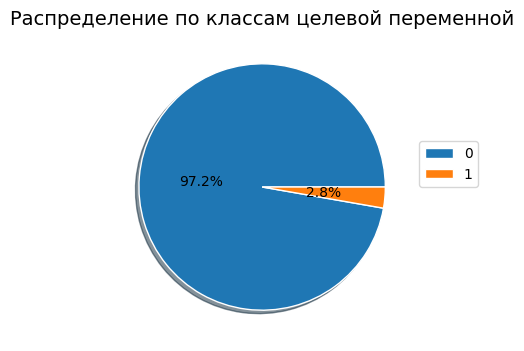

In [41]:
    plt.figure(figsize=(4, 4))
    values = df_train['осложнения'].value_counts().values
    labels = df_train['осложнения'].value_counts().index
    plt.pie(
        values,
        wedgeprops={'edgecolor': 'w'},
        shadow=True,
        pctdistance = 0.5,
        autopct=lambda x: f'{x:.1f}%' if x > 1 else ''
    )
    plt.legend(labels=labels, loc=[1.01, 0.5])
    plt.title(f'Распределение по классам целевой переменной', fontsize=14)
    plt.show()

Целевая переменная сильно несбалансированная: минорный класс, который несет информацию об осложнениях имеет наблюдений более чем в 35 меньше.

### Количественные признаки

In [42]:
num_cols = [col for col in df_train.columns if len(df_train[col].unique()) > 31]
num_cols

['возраст',
 'имт',
 'охс',
 'лпнп',
 'креатинин',
 'скф',
 'офв_лж',
 'еuroscore1',
 'euroscore2',
 'euroscore_calc']

In [43]:
cat_cols = [col for col in df_train.columns if col not in num_cols + ['осложнения']]

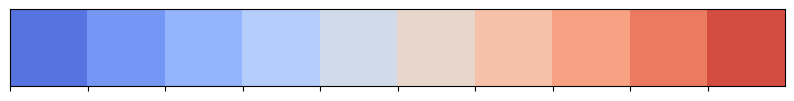

In [44]:
sns.palplot(sns.color_palette('coolwarm', n_colors=10))

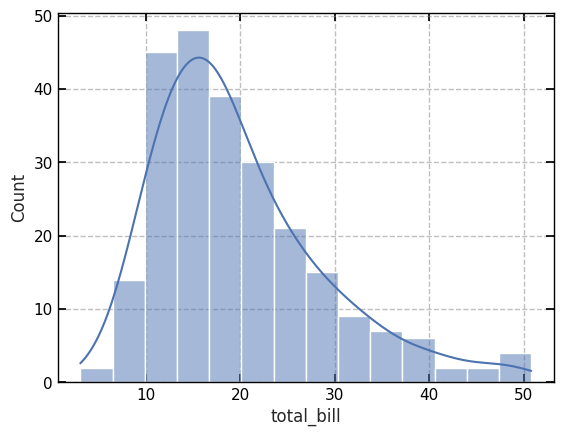

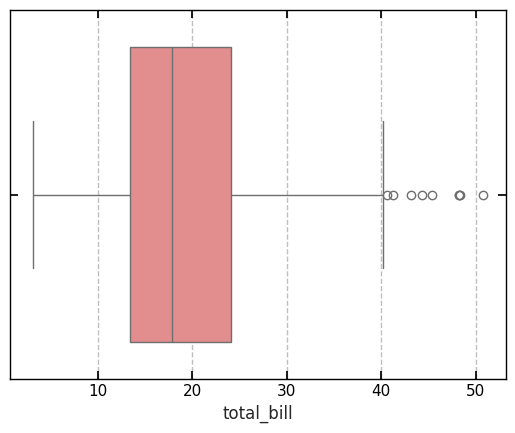

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Настраиваем глобальный стиль
sns.set_theme(
    style="whitegrid",        # фон + сетка
    rc={
        # Настройка осей
        'axes.edgecolor': 'black',       # цвет рамки графика
        'axes.linewidth': 1,         # ширина рамки
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.direction': 'in',
        'ytick.direction': 'in',
        'xtick.top': True,
        'ytick.right': True,
        'xtick.bottom': True,
        'ytick.left': True,
        # Настройка шрифта
        'font.size': 12,
        # Настройка сетки
        'grid.color': 'gray',
        'grid.linestyle': '--',
        'grid.alpha': 0.5
    }
)

# Глобально включаем все спайны (рамки)
plt.rcParams['axes.spines.top'] = True
plt.rcParams['axes.spines.right'] = True
plt.rcParams['axes.spines.left'] = True
plt.rcParams['axes.spines.bottom'] = True

# Теперь все графики будут в этом стиле
tips = sns.load_dataset("tips")

sns.histplot(tips['total_bill'], kde=True)
plt.show()

sns.boxplot(x=tips['total_bill'], color='lightcoral', orient='h')
plt.show()


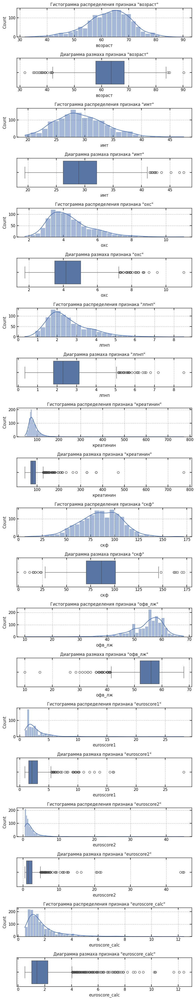

In [46]:
n = len(num_cols)

fig, axes = plt.subplots(
    nrows=n*2,
    sharex=False,
    figsize=(8, 4*n)
)

for i, col in enumerate(num_cols):
    ax_hist = axes[i*2]
    ax_box = axes[i*2 + 1]

    sns.histplot(df_train[col], kde=True, ax=ax_hist)
    ax_hist.set_title(f'Гистограмма распределения признака "{col}"')
    ax_hist.set_xlabel(col)

    sns.boxplot(x=df_train[col], ax=ax_box, orient='h')
    ax_box.set_title(f'Диаграмма размаха признака "{col}"')
    ax_box.set_xlabel(col)

plt.tight_layout()
plt.show()


+ `возраст` - нормальное распределение с левой ассиметрией, много выбросов для возраста 41-42 лет.
+ `имт` - нормальное распределение с правой ассиметрией в сторону сильного ожирения, там же и выбросы;
+ `охс` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня холестерина(>6.2);
+ `лпнп` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня лпнп(>5);
+ `креатинин` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня креатинина(>120-130);
+ `скф` - симметричное нормальное распределение, мультимодальное(из-за полового различия), с выбросами по краям;
+ `офв_лж` - нормальное распределение с сильной левой ассиметрией и выбросами в стороне сниженной функции желудочка(< 40%);
+ `еuroscore1` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня оценки(>5);
+ `еuroscore2` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня оценки(>5);
+ `еuroscore_calc` - нормально распределен с правой ассиметрией и выбросами в области высокого уровня оценки(>4).

При подготвке данных следует учесть большое количество выбросов и размах у таких признаков:
+ `креатинин`;
+ `офв_лж`;
+ `еuroscore1`, `еuroscore2`
Возможно для них стоит сделать логарифмирование.

### В разрезе таргета

Построим pairplot для наиболее значимых признаков с точки зрения разделения по классам таргета. Для этого выделим признаки, у которых статистически значимой является разница средних подвыборок осложнений.

In [47]:
import pandas as pd
from scipy import stats

target = 'осложнения'
alpha = 0.05  # уровень значимости
results = []

for col in num_cols:
    group0 = df_train.loc[df_train[target] == 0, col].dropna()
    group1 = df_train.loc[df_train[target] == 1, col].dropna()

    # Проверим нормальность, чтобы решить какой тест использовать
    _, p0 = stats.shapiro(group0.sample(min(5000, len(group0))))  # ограничим до 5000 наблюдений
    _, p1 = stats.shapiro(group1.sample(min(5000, len(group1))))

    if p0 > 0.05 and p1 > 0.05:
        # если обе выборки нормальные — t-test
        stat, pval = stats.ttest_ind(group0, group1, equal_var=False)
        test_used = "t-test"
    else:
        # иначе Манна–Уитни
        stat, pval = stats.mannwhitneyu(group0, group1, alternative='two-sided')
        test_used = "mannwhitneyu"

    results.append({
        'feature': col,
        'test': test_used,
        'p_value': pval,
        'significant': pval < alpha
    })

results_df = pd.DataFrame(results).sort_values('p_value')


In [48]:
results_df

,feature,test,p_value,significant
4,креатинин,mannwhitneyu,0.000720,True
5,скф,mannwhitneyu,0.001546,True
8,euroscore2,mannwhitneyu,0.002694,True
9,euroscore_calc,mannwhitneyu,0.021747,True
0,возраст,mannwhitneyu,0.027659,True
6,офв_лж,mannwhitneyu,0.035746,True
2,охс,mannwhitneyu,0.084678,False
7,еuroscore1,mannwhitneyu,0.179044,False
3,лпнп,mannwhitneyu,0.231783,False
1,имт,mannwhitneyu,0.344103,False


Таких среди количественных 6 признаков, добавим еще пограничный `охс`

In [49]:
pair_cols = results_df[results_df['significant'] == True]['feature'].unique().tolist()
pair_cols.append('охс')

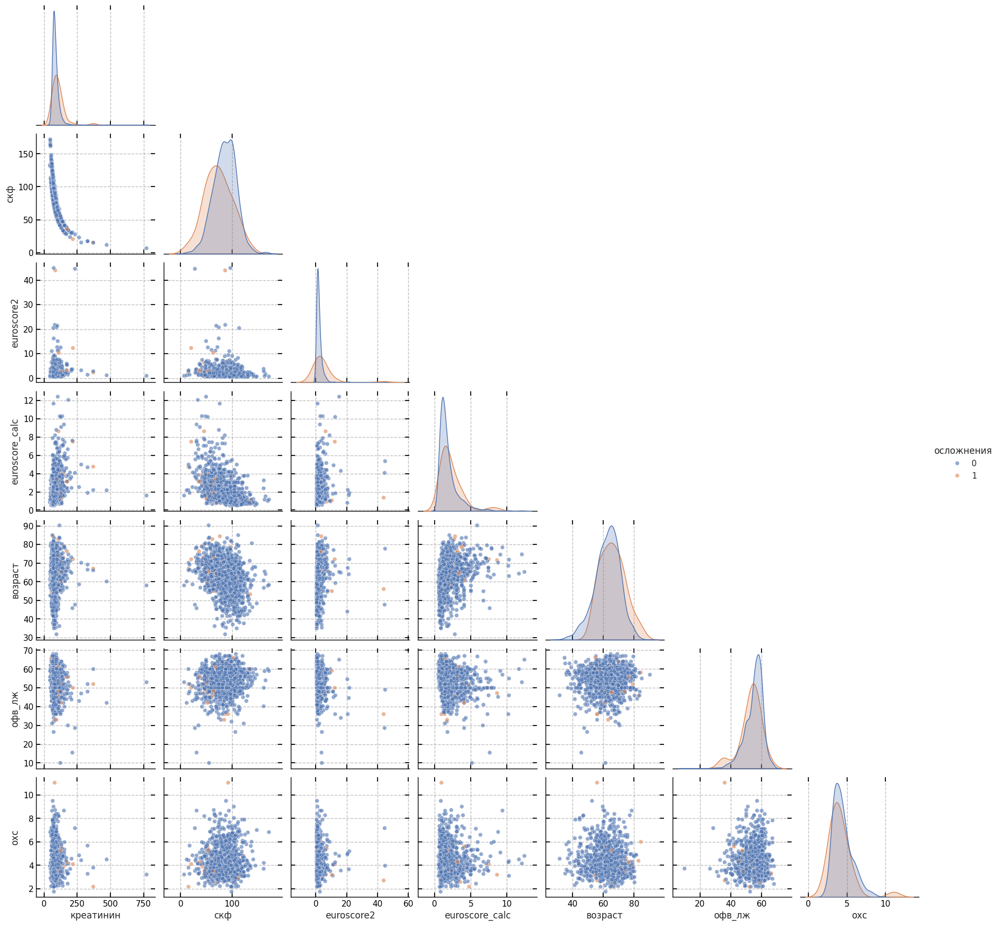

In [50]:
sns.pairplot(df_train[pair_cols + ['осложнения']],
             hue='осложнения',
             diag_kind='kde',        # или 'hist'
             corner=True,            # только нижний треугольник (удобнее)
             height=2.5,
             plot_kws={'alpha': 0.6, 's': 30},
             diag_kws={'common_norm': False})
plt.show()


Линейных зависимостей здесь не наблюдаем. В целом, видим случаи осложнений на границах наблюдений без осложнений в разных комбинациях признаков. Что указывает на некий тренд, и поможет в дальнейшем модели.

Рассмотрим распределения всех количественных признаков по разным классам целевой переменной:

In [51]:
def enable_all_spines_in_grid(g):
    """Включает все рамки (spines) во всех осях FacetGrid."""
    for ax in g.axes.flatten():
        for side in ['top', 'right', 'bottom', 'left']:
            ax.spines[side].set_visible(True)

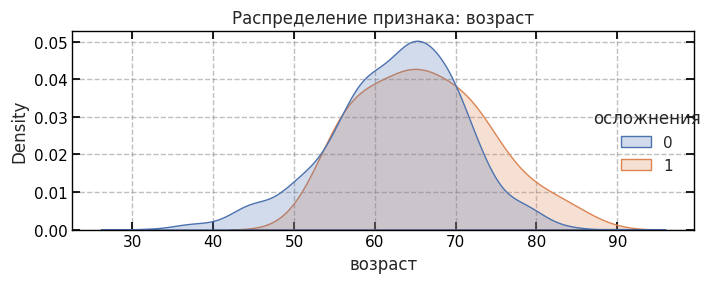

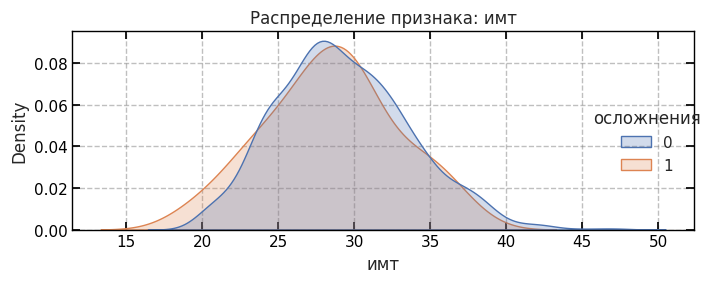

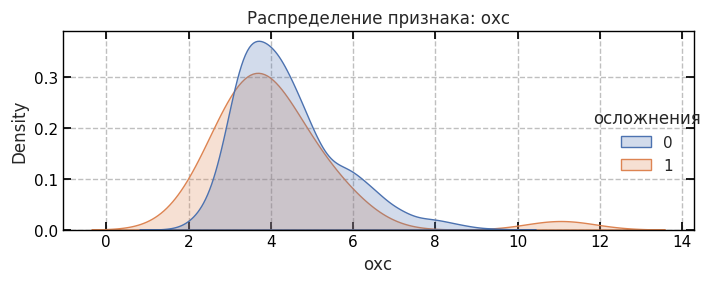

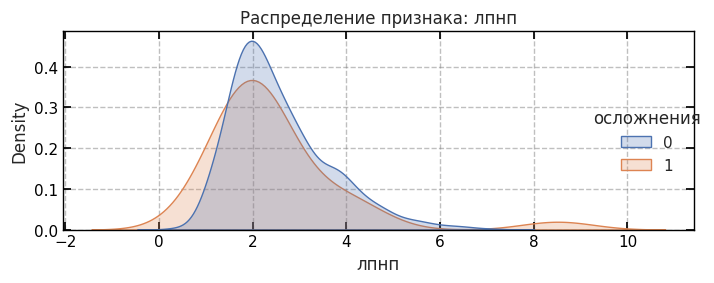

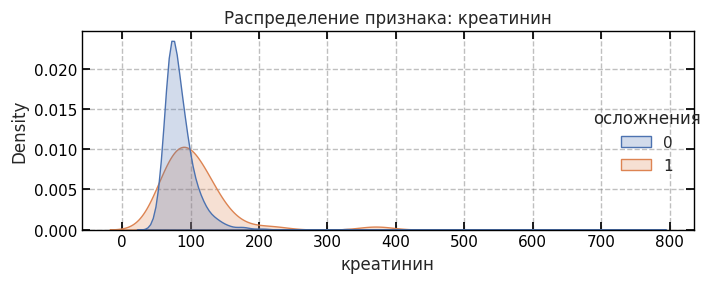

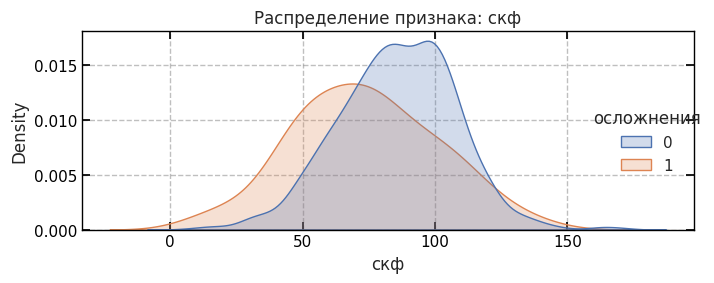

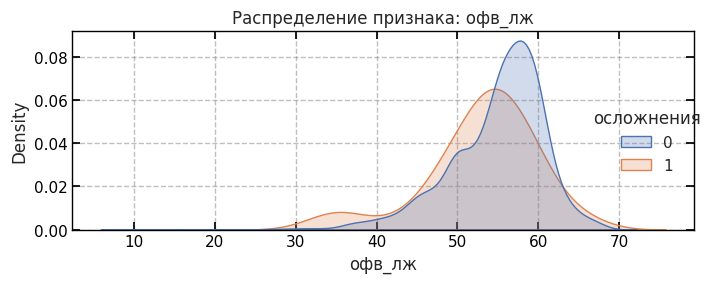

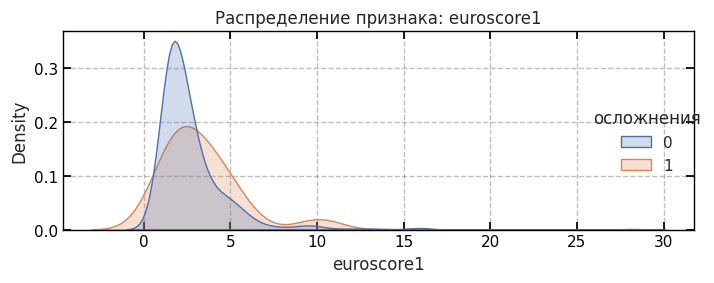

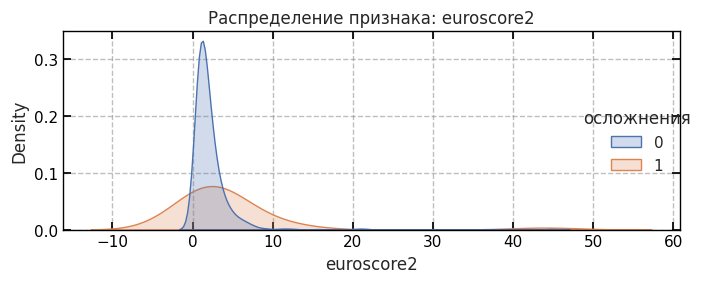

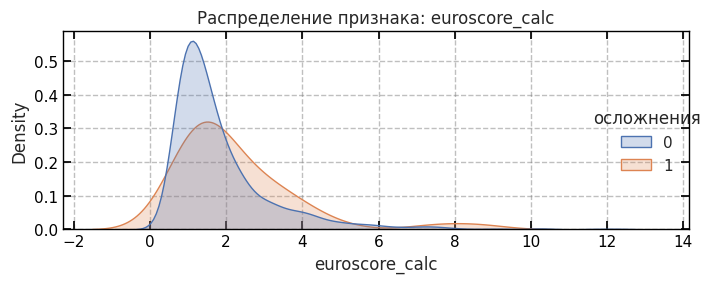

In [52]:
for col in num_cols:
    g =  sns.displot(
        data=df_train,
        x=col,
        hue="осложнения",
        kind="kde",
        fill=True,
        common_norm=False,
        height=3,
        aspect=2
    )
    enable_all_spines_in_grid(g)
    plt.title(f'Распределение признака: {col}')
    plt.tight_layout()
    plt.show()


**Осложнения наблюдаются в большей степени у пациентов**:
+ старше 70 лет;
+ с очень высоким уровнем холестерина(> 10);
+ с очень высоким уровнем лпнп(> 7);
+ с высоким уровнем креатинина (>200);
+ с низкой скоростью фильтрации почек;
+ с пониженной фракцией выброса левого желудочка(<40%);
+ с высокими показателями разных euroscore.

### Категориальные признаки

### Бинарные признаки

Выделим и отдельно рассмотрим бинарные категориальные признаки:

In [53]:
bin_cat_cols = [col for col in cat_cols if len(df_train[col].unique()) == 2]
bin_cat_cols

['пол',
 'возрастные_группы',
 'курение',
 'аг',
 'наличие_сд',
 'хбп',
 'чкв_анамнез',
 'мфа',
 'пикс',
 'сужение_вса_более_70%',
 'сужение_магистр_артерий_нк_более_70%',
 'поражение_ствола_лка_более_50%',
 'поражение_пмжв',
 'поражение_1_мак',
 'поражение_2_мак',
 'поражение_3_мак',
 'есть_ик',
 'акш_и_тмлр',
 'вабк',
 'шунтирование_пмжв',
 'мкш_и_пмжв',
 'акш_анамнез']

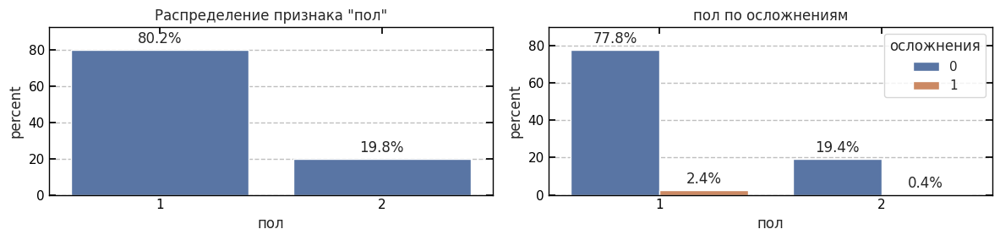

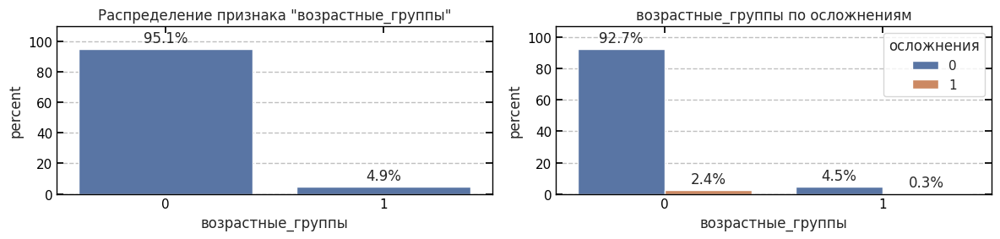

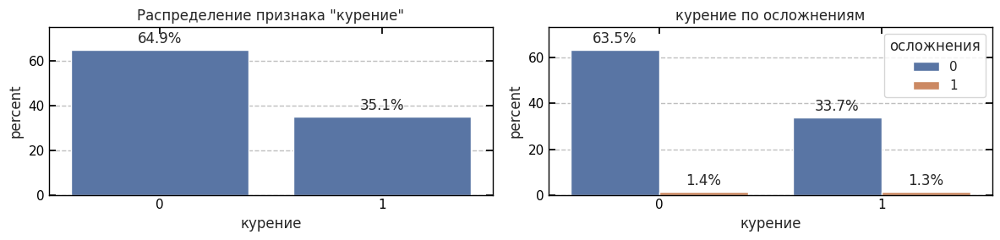

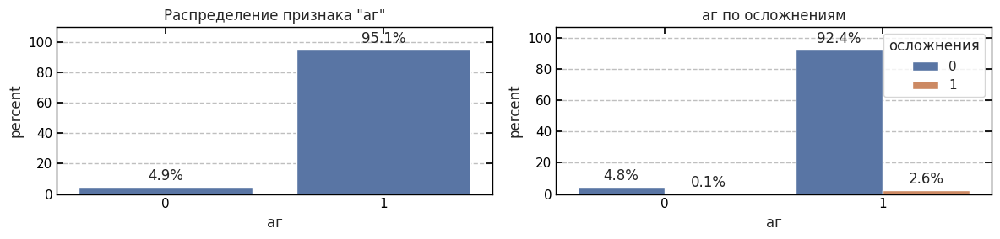

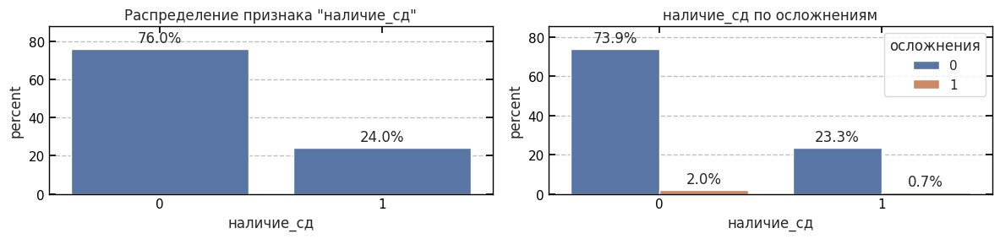

...

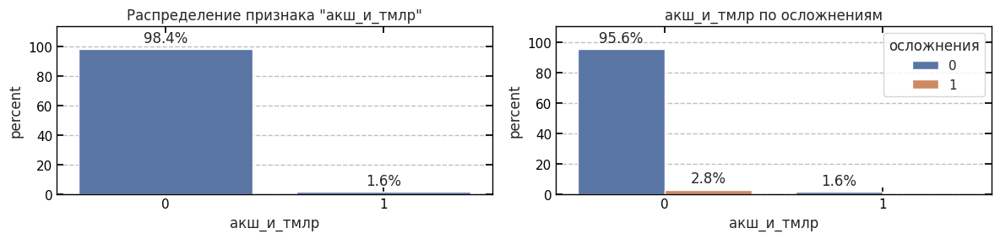

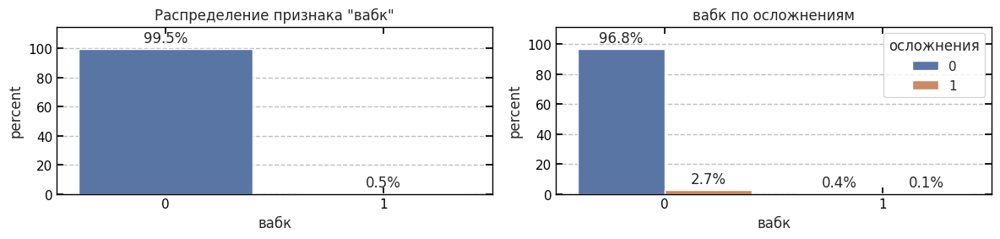

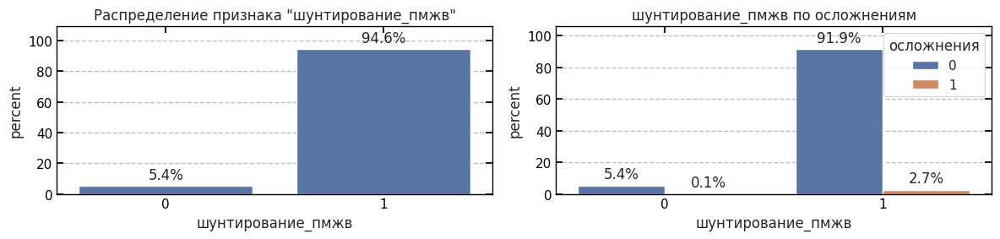

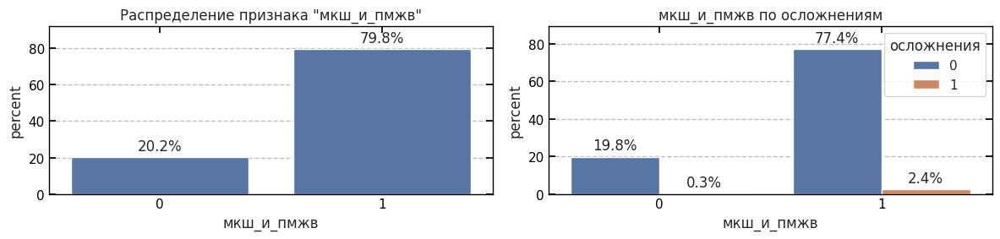

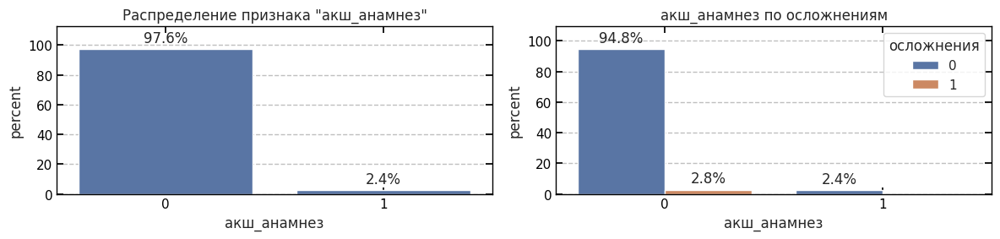

In [54]:
for col in bin_cat_cols:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))

    # левый график распределение по категориям признака
    sns.countplot(x=col, data=df_train, ax=ax1, stat='percent')
    ax1.set_title(f'Распределение признака "{col}"')

    # подписи для левого графика
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.1f%%', padding=3)

    ax1.set_ylim(0, ax1.get_ylim()[1] * 1.1)

    # Правый график - распределение по таргету
    sns.countplot(x=col, hue='осложнения', data=df_train, stat='percent', ax=ax2)
    ax2.set_title(f'{col} по осложнениям')

    # подписи для правого графика
    for container in ax2.containers:
        ax2.bar_label(container, fmt='%.1f%%', padding=3)

    ax2.set_ylim(0, ax2.get_ylim()[1] * 1.1)

    plt.tight_layout()
    plt.show()

Отметим признаки, имеющие значительные различия по классам таргета:
+ `пол` - пациентов мужского пола в 4 раза больше, однако осложнений у мужчин больше в 6 раз;
+ `курение` - осложнений у курящей и некурящей группы почти равное количество, однако курящих меньше почти в 2 раза;
+ `мфа` -  в нормализованном виде у пациентов с атеросклерозом процент осложнений выше;
+ `поражение_ствола_лка_более_50%` - у пациентов со стенозом коронарной артерии тоже выражены осложнения;
+ `акш_и_тмлр` - при проведении такой процедуры осложнения практически отсутствуют;
+ `акш_анамнез` - при повторном шунтировании осложнения практически отсутствуют;

### Временные признаки

Отдельно рассмотрим временные признаки:

In [55]:
time_cols = ['продолжительность_стационара',
             'год_операции',
             'месяц_операции',
             'день_операции',
             'день_недели_операции']

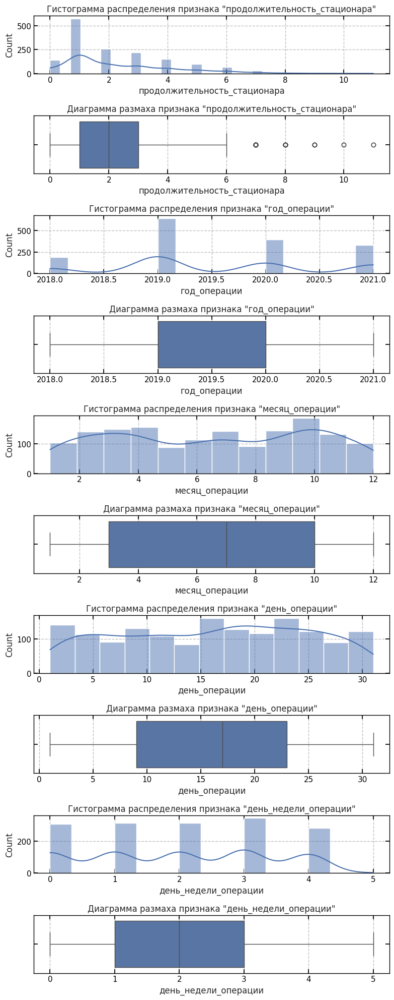

In [56]:
n = len(time_cols)

fig, axes = plt.subplots(
    nrows=n*2,
    sharex=False,
    figsize=(8, 4*n)
)

for i, col in enumerate(time_cols):
    ax_hist = axes[i*2]
    ax_box = axes[i*2 + 1]

    sns.histplot(df_train[col], kde=True, ax=ax_hist)
    ax_hist.set_title(f'Гистограмма распределения признака "{col}"')
    ax_hist.set_xlabel(col)

    sns.boxplot(x=df_train[col], ax=ax_box, orient='h')
    ax_box.set_title(f'Диаграмма размаха признака "{col}"')
    ax_box.set_xlabel(col)

plt.tight_layout()
plt.show()


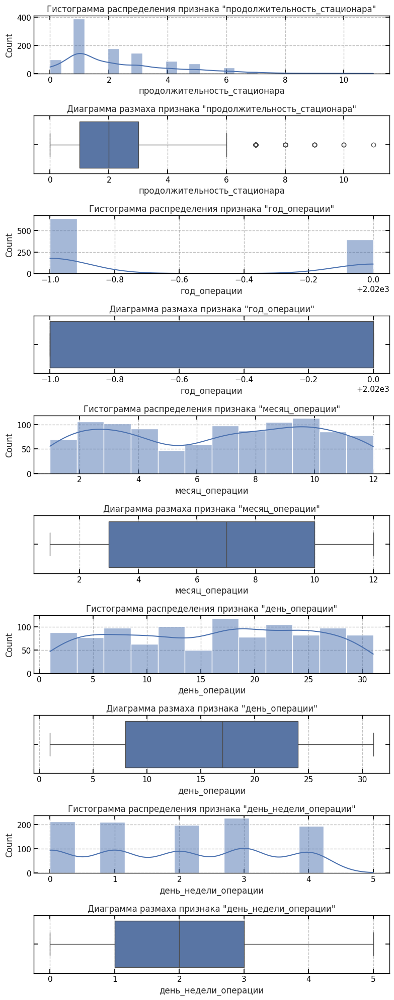

In [57]:
n = len(time_cols)

df = df_train[df_train['год_операции'].isin([2019, 2020])]

fig, axes = plt.subplots(
    nrows=n*2,
    sharex=False,
    figsize=(8, 4*n)
)

for i, col in enumerate(time_cols):
    ax_hist = axes[i*2]
    ax_box = axes[i*2 + 1]

    sns.histplot(df[col], kde=True, ax=ax_hist)
    ax_hist.set_title(f'Гистограмма распределения признака "{col}"')
    ax_hist.set_xlabel(col)

    sns.boxplot(x=df[col], ax=ax_box, orient='h')
    ax_box.set_title(f'Диаграмма размаха признака "{col}"')
    ax_box.set_xlabel(col)

plt.tight_layout()
plt.show()


**Особенности**:
+ половину всех операций делают в первые 48 часов, при этому мода - первые 24 часа.
+ больше всего операций было выполнено в 2019 году.
+ самые пиковые месяцы:
    + март-апрель;
    + сентябрь-октябрь;
    + июль, но летом операций меньше, чем в начале или в конце года.
+ в течении месяца больше операций приходится на вторую половину месяца.
+ по дням недели количество распределено почти равномерно, кроме пт(меньше чем в будни) и выходных(не проводятся).

Рассмотрим распределения операций с осложненями во временной динамике:

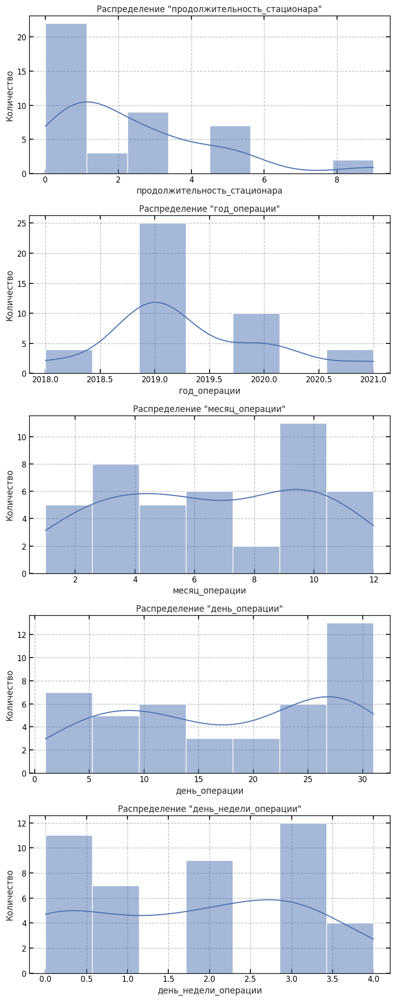

In [58]:
df_train_neg = df_train[df_train['осложнения'] == 1]

plt.figure(figsize=(8, 4 * len(time_cols)))

for i, col in enumerate(time_cols, 1):
    plt.subplot(len(time_cols), 1, i)
    sns.histplot(df_train_neg[col], kde=True)
    plt.title(f'Распределение "{col}"')
    plt.xlabel(col)
    plt.ylabel('Количество')

plt.tight_layout()
plt.show()

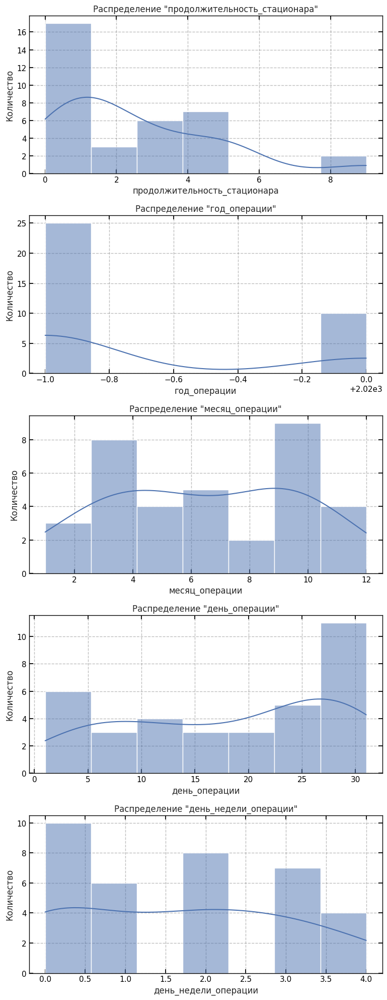

In [59]:
df_train_neg = df_train.loc[(df_train['осложнения'] == 1) &
                            (df_train['год_операции'].isin([2019, 2020]))]

plt.figure(figsize=(8, 4 * len(time_cols)))

for i, col in enumerate(time_cols, 1):
    plt.subplot(len(time_cols), 1, i)
    sns.histplot(df_train_neg[col], kde=True)
    plt.title(f'Распределение "{col}"')
    plt.xlabel(col)
    plt.ylabel('Количество')

plt.tight_layout()
plt.show()

**Особенности**:
+ Больше всего осложнений наблюдается в первые 24 часа;
+ Распределение осложнений по годам и месяцам соответствует количеству операций;
+ Значительное увеличение осложнений наблюдается в последнюю неделю месяца;
+ наибольшее количество осложнений приходится на понедельник и четверг.

### Остальные категориальные

Отделим оставшиеся категориальные признаки и исследуем их:

In [60]:
exclude = set(time_cols + bin_cat_cols)
several_cat_cols = [col for col in cat_cols if col not in exclude]
several_cat_cols.remove('год_поступления')
several_cat_cols

['фк_стенокардии',
 'типы_сд',
 'степень_имт',
 'ритм_экг',
 'еuroscore1_абс',
 'степени_еuroscore',
 'акш',
 'стентирование_ка',
 'стентирование_ствола_лка']

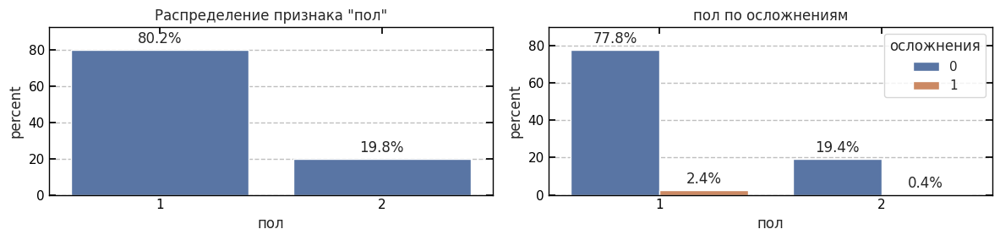

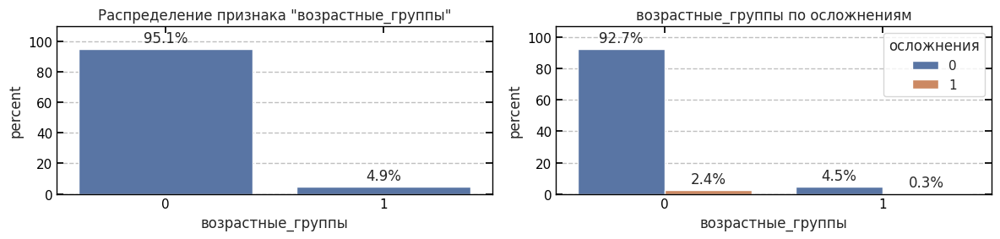

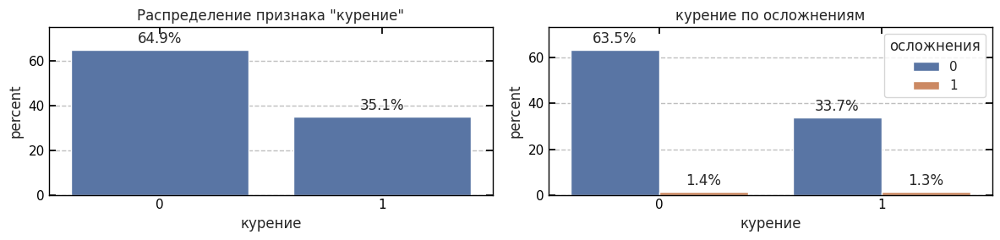

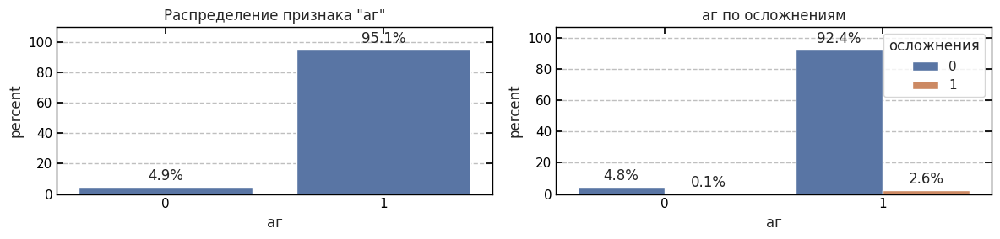

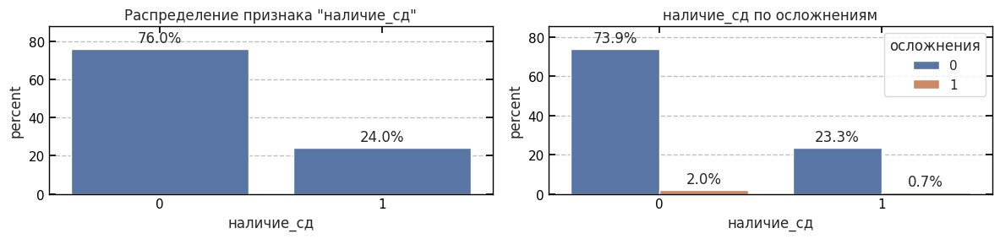

...

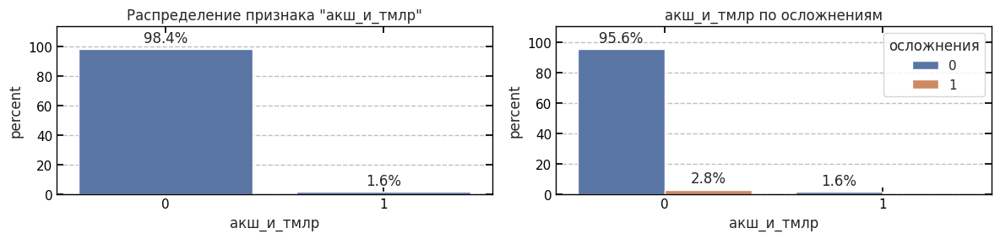

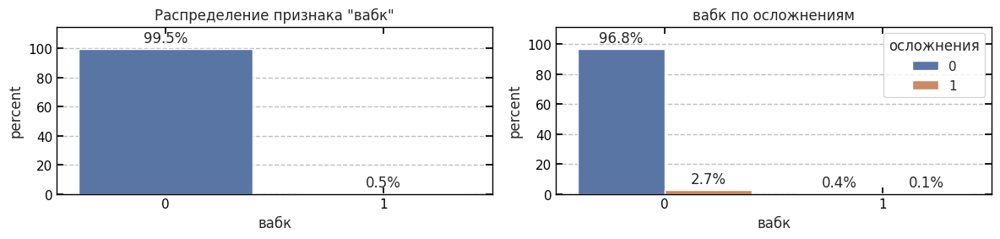

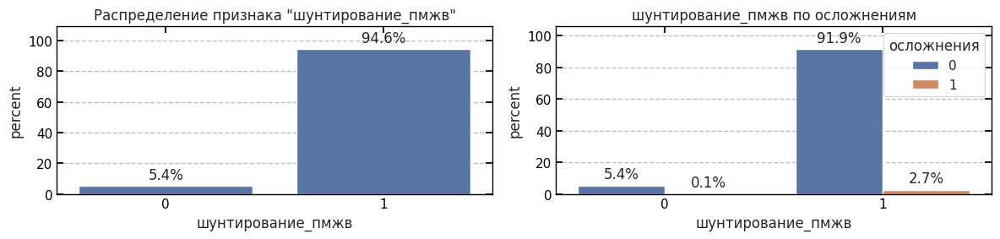

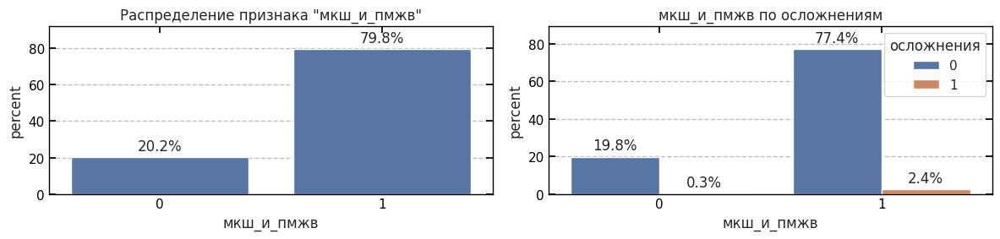

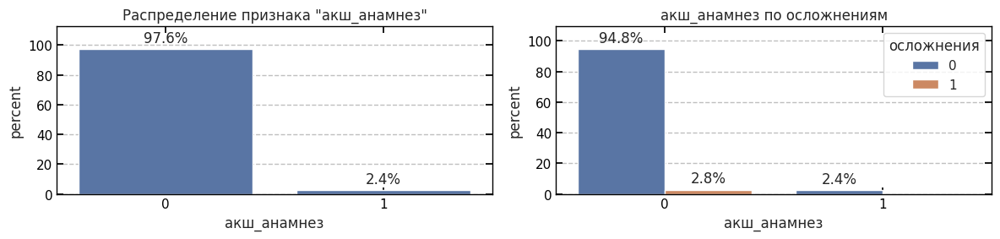

In [61]:
for col in bin_cat_cols:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))

    # левый график распределение по категориям признака
    sns.countplot(x=col, data=df_train, ax=ax1, stat='percent')
    ax1.set_title(f'Распределение признака "{col}"')

    # подписи для левого графика
    for container in ax1.containers:
        ax1.bar_label(container, fmt='%.1f%%', padding=3)

    ax1.set_ylim(0, ax1.get_ylim()[1] * 1.1)

    # Правый график - распределение по таргету
    sns.countplot(x=col, hue='осложнения', data=df_train, stat='percent', ax=ax2)
    ax2.set_title(f'{col} по осложнениям')

    # подписи для правого графика
    for container in ax2.containers:
        ax2.bar_label(container, fmt='%.1f%%', padding=3)

    ax2.set_ylim(0, ax2.get_ylim()[1] * 1.1)

    plt.tight_layout()
    plt.show()

In [62]:
for col in bin_cat_cols:
    print(f'\n=== {col} ===')

    ctab_cols = pd.crosstab(df_train[col], df_train['осложнения'], normalize='columns') * 100
    ctab_idx = pd.crosstab(df_train[col], df_train['осложнения'], normalize='index') * 100

    print('Доля по столбцам (вклад категории в осложнение):')
    display(ctab_cols.round(1))

    print('Доля по строкам (вероятность осложнения внутри категории):')
    display(ctab_idx.round(1))



=== пол ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
пол,,
1,80.1,86.0
2,19.9,14.0


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
пол,,
1,97.0,3.0
2,98.1,1.9



=== возрастные_группы ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
возрастные_группы,,
0,95.3,88.4
1,4.7,11.6


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
возрастные_группы,,
0,97.4,2.6
1,93.4,6.6



=== курение ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
курение,,
0,65.3,51.2
1,34.7,48.8


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
курение,,
0,97.8,2.2
1,96.2,3.8



=== аг ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
аг,,
0,4.9,4.7
1,95.1,95.3


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
аг,,
0,97.4,2.6
1,97.2,2.8



=== наличие_сд ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
наличие_сд,,
0,76.0,74.4
1,24.0,25.6


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
наличие_сд,,
0,97.3,2.7
1,97.1,2.9



=== хбп ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
хбп,,
0,93.9,88.4
1,6.1,11.6


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
хбп,,
0,97.4,2.6
1,94.9,5.1



=== чкв_анамнез ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
чкв_анамнез,,
0,69.9,83.7
1,30.1,16.3


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
чкв_анамнез,,
0,96.7,3.3
1,98.5,1.5



=== мфа ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
мфа,,
0,64.8,53.5
1,35.2,46.5


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
мфа,,
0,97.7,2.3
1,96.4,3.6



=== пикс ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
пикс,,
0,40.7,32.6
1,59.3,67.4


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
пикс,,
0,97.8,2.2
1,96.9,3.1



=== сужение_вса_более_70% ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
сужение_вса_более_70%,,
0,88.7,83.7
1,11.3,16.3


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
сужение_вса_более_70%,,
0,97.4,2.6
1,96.1,3.9



=== сужение_магистр_артерий_нк_более_70% ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
сужение_магистр_артерий_нк_более_70%,,
0,87.0,86.0
1,13.0,14.0


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
сужение_магистр_артерий_нк_более_70%,,
0,97.3,2.7
1,97.1,2.9



=== поражение_ствола_лка_более_50% ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
поражение_ствола_лка_более_50%,,
0,69.9,58.1
1,30.1,41.9


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
поражение_ствола_лка_более_50%,,
0,97.7,2.3
1,96.2,3.8



=== поражение_пмжв ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
поражение_пмжв,,
0,7.8,4.7
1,92.2,95.3


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
поражение_пмжв,,
0,98.3,1.7
1,97.2,2.8



=== поражение_1_мак ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
поражение_1_мак,,
0,91.5,93.0
1,8.5,7.0


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
поражение_1_мак,,
0,97.2,2.8
1,97.7,2.3



=== поражение_2_мак ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
поражение_2_мак,,
0,68.3,62.8
1,31.7,37.2


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
поражение_2_мак,,
0,97.5,2.5
1,96.8,3.2



=== поражение_3_мак ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
поражение_3_мак,,
0,40.4,44.2
1,59.6,55.8


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
поражение_3_мак,,
0,97.0,3.0
1,97.4,2.6



=== есть_ик ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
есть_ик,,
0,62.0,69.8
1,38.0,30.2


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
есть_ик,,
0,96.9,3.1
1,97.8,2.2



=== акш_и_тмлр ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
акш_и_тмлр,,
0,98.4,100.0
1,1.6,0.0


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
акш_и_тмлр,,
0,97.2,2.8
1,100.0,0.0



=== вабк ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
вабк,,
0,99.5,97.7
1,0.5,2.3


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
вабк,,
0,97.3,2.7
1,87.5,12.5



=== шунтирование_пмжв ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
шунтирование_пмжв,,
0,5.5,2.3
1,94.5,97.7


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
шунтирование_пмжв,,
0,98.8,1.2
1,97.2,2.8



=== мкш_и_пмжв ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
мкш_и_пмжв,,
0,20.4,11.6
1,79.6,88.4


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
мкш_и_пмжв,,
0,98.4,1.6
1,97.0,3.0



=== акш_анамнез ===
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
акш_анамнез,,
0,97.5,100.0
1,2.5,0.0


Доля по строкам (вероятность осложнения внутри категории):


осложнения,0,1
акш_анамнез,,
0,97.2,2.8
1,100.0,0.0


Выделим признаки, вносящие наибольший вклад в категории таргета:
+ `пол` - пациенты мужского пола значительно больше имеют осложнений после операции;
+ `курение` - курящие пациенты имеют почти одинаковое количество осложнений, но в таких пациентов в два раза меньше;
+ `хбп` - осложнений немного больше у пациентов с болезнью почек;
+ `чкв_анамнез` - меньше осложнений у пациентов с применявших процедуру;
+ `мфа` - больше осложнений у пациентов, имеющих атеросклероз;
+ `пикс` - больше осложнений у пациентов, имеющих постинфарктный кардиосклероз;
+ `поражение_ствола_лка_более_50%` - у пациентов со стенозом наблюдается больше осложнений;

Рассмотрим оставшуюся категорию признаков:

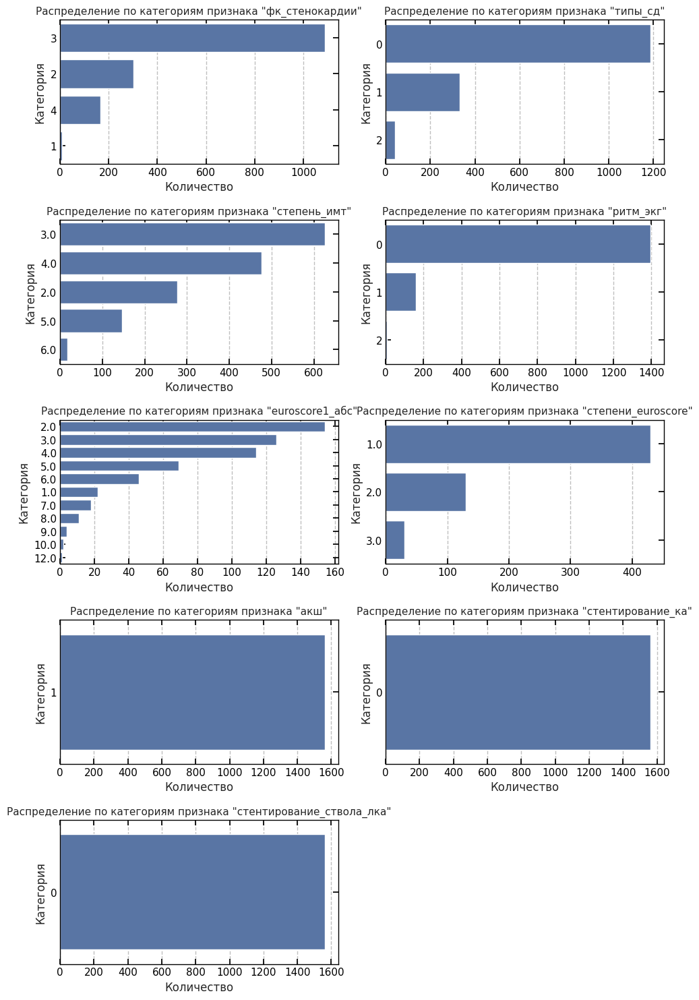

In [63]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 15))

for i, col in enumerate(several_cat_cols):
    plt.subplot(5, 2, i + 1)
    sns.countplot(
        data=df_train,
        y=col,
        order=df_train[col].value_counts().index
    )
    plt.title(f'Распределение по категориям признака "{col}"', fontsize=11)
    plt.xlabel('Количество')
    plt.ylabel('Категория')

plt.tight_layout()
plt.show()


В данной выборке нет пациентов, кому бы делали стентирование, и, напротив, всем пациентам проводили шунтирование.

In [64]:
for col in several_cat_cols:
    print(f'Вклад категории признака "{col}"')

    ctab_cols = pd.crosstab(df_train[col], df_train['осложнения'], normalize='columns') * 100
    ctab_idx = pd.crosstab(df_train[col], df_train['осложнения'], normalize='index') * 100

    print('Доля по столбцам (вклад категории в осложнение):')
    display(ctab_cols.round(1))

    # print('Доля по строкам (вероятность осложнения внутри категории):')
    # display(ctab_idx.round(1))

Вклад категории признака "фк_стенокардии"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
фк_стенокардии,,
1,0.5,0.0
2,19.3,18.6
3,69.7,69.8
4,10.6,11.6


Вклад категории признака "типы_сд"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
типы_сд,,
0,76.0,74.4
1,21.3,20.9
2,2.7,4.7


Вклад категории признака "степень_имт"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
степень_имт,,
2.0,17.8,23.8
3.0,40.7,35.7
4.0,30.9,31.0
5.0,9.5,9.5
6.0,1.1,0.0


Вклад категории признака "ритм_экг"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
ритм_экг,,
0,89.8,72.1
1,9.7,25.6
2,0.5,2.3


Вклад категории признака "еuroscore1_абс"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
еuroscore1_абс,,
1.0,4.0,0.0
2.0,27.4,20.0
3.0,22.3,20.0
4.0,20.3,13.3
5.0,12.0,20.0
6.0,7.8,20.0
7.0,3.3,0.0
8.0,1.8,6.7
9.0,0.7,0.0


Вклад категории признака "степени_еuroscore"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
степени_еuroscore,,
1.0,73.3,56.2
2.0,21.6,37.5
3.0,5.1,6.2


Вклад категории признака "акш"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
акш,,
1,100.0,100.0


Вклад категории признака "стентирование_ка"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
стентирование_ка,,
0,100.0,100.0


Вклад категории признака "стентирование_ствола_лка"
Доля по столбцам (вклад категории в осложнение):


осложнения,0,1
стентирование_ствола_лка,,
0,100.0,100.0


In [65]:
df_train[df_train['осложнения'] == 1].shape

(43, 48)

Отметим признаки с наибольшим вкладом в осложнения:
+ `ритм_экг` - у пациентов с фибриляцией предсердий осложнений больше;
+ `еuroscore1_абс` - у пациентов со оценкой 5 и 6 осложнений больше;
+ `степени_еuroscore` - для пациентов со степенью 2 осложнений больше;

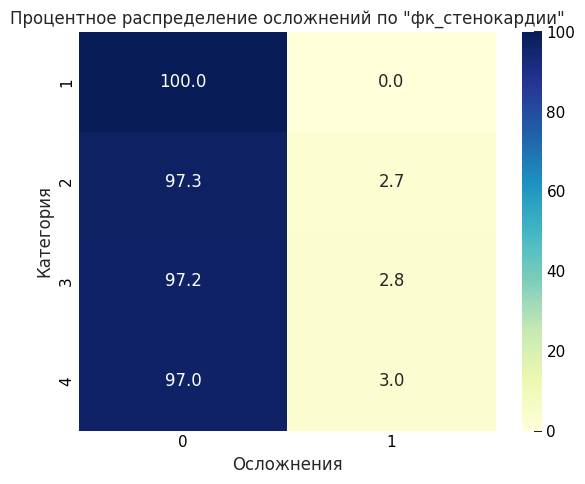

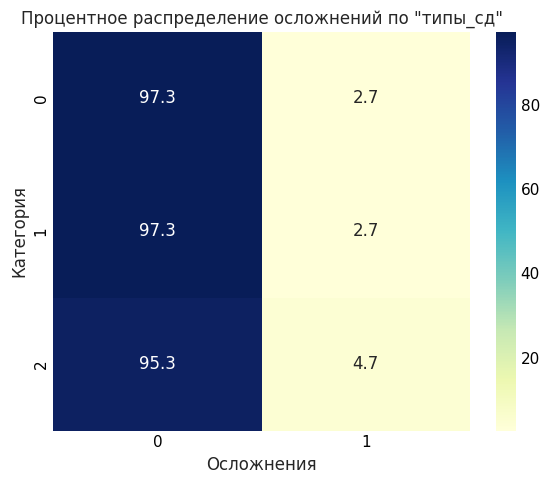

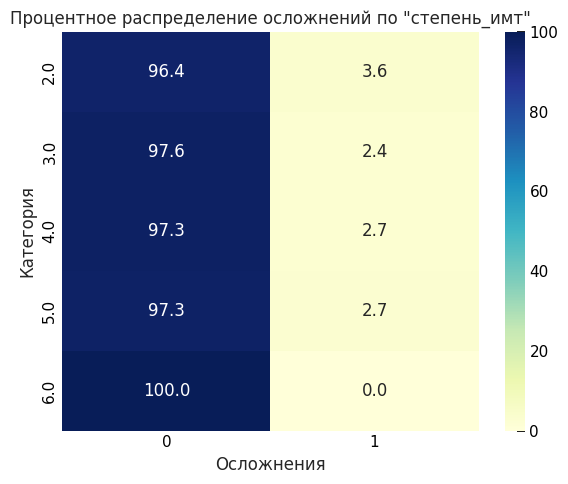

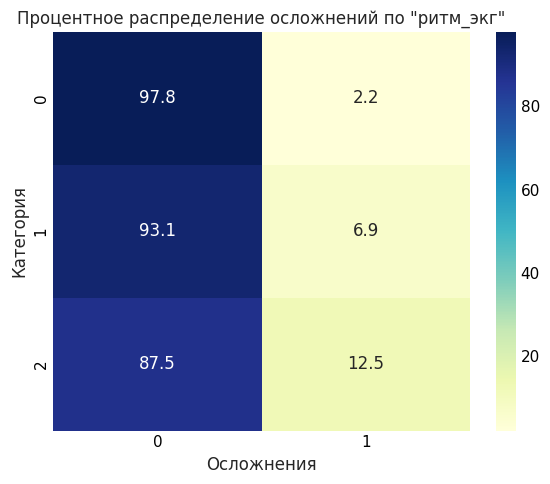

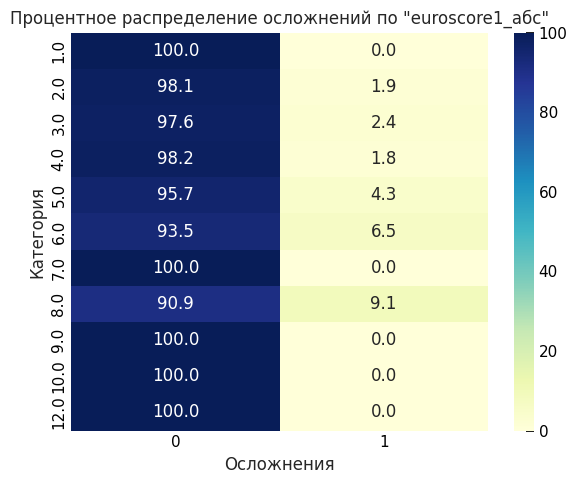

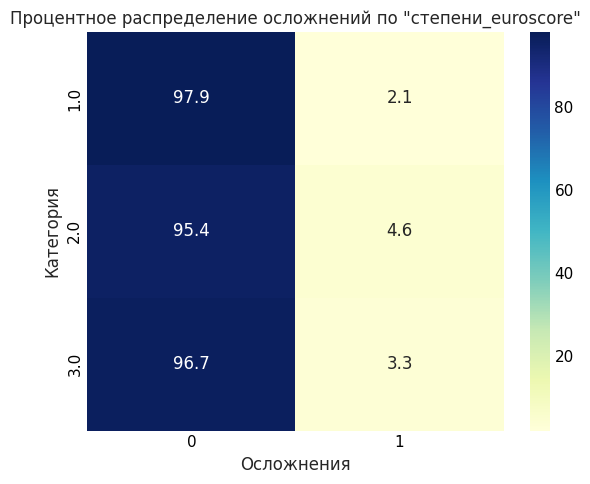

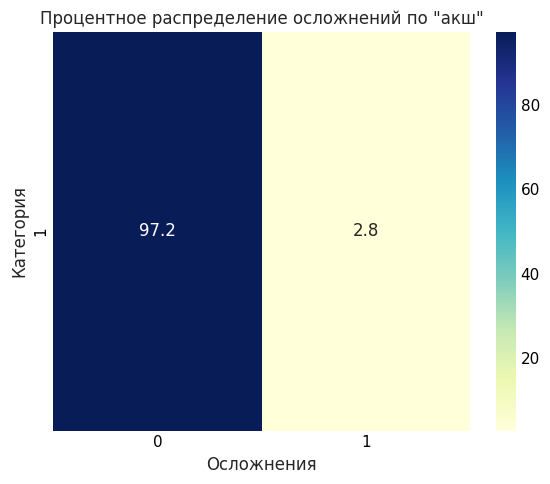

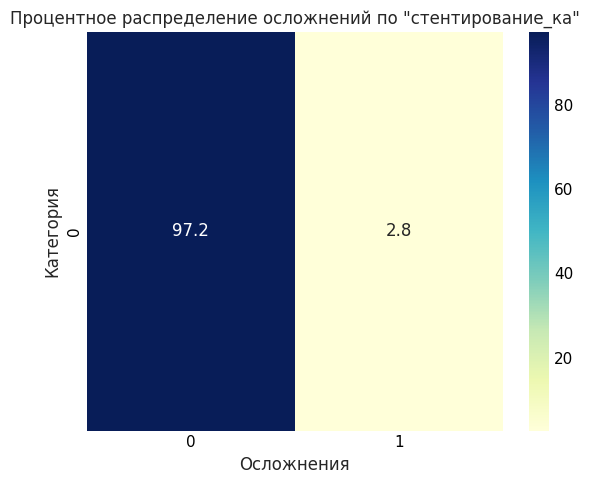

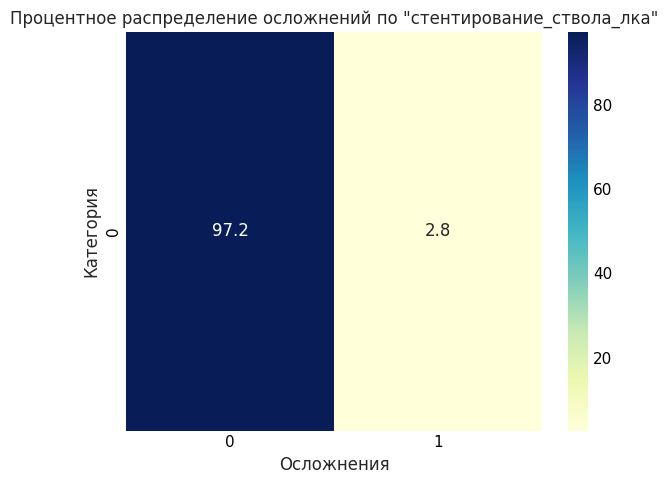

In [66]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

for col in several_cat_cols:
    ct = pd.crosstab(df_train[col], df_train['осложнения'], normalize='index') * 100
    plt.figure(figsize=(6, 5))
    sns.heatmap(ct, annot=True, fmt='.1f', cmap='YlGnBu')
    plt.title(f'Процентное распределение осложнений по "{col}"')
    plt.ylabel('Категория')
    plt.xlabel('Осложнения')
    plt.tight_layout()
    plt.show()


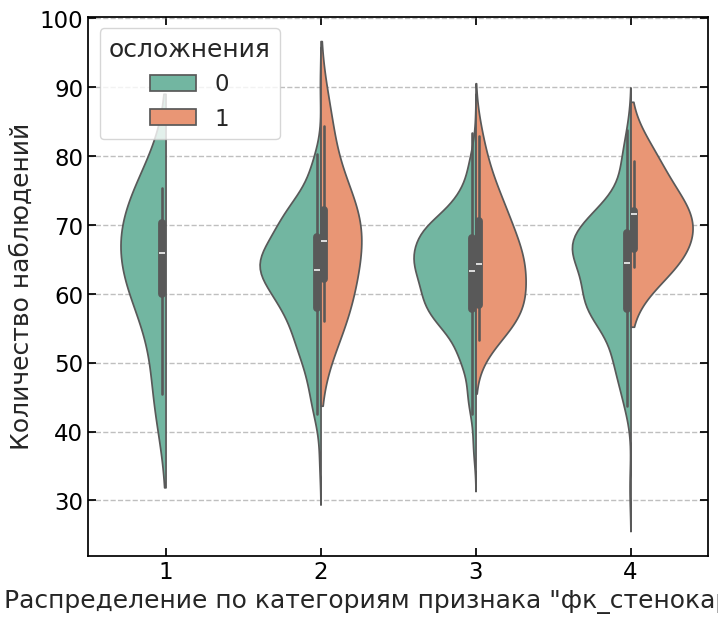

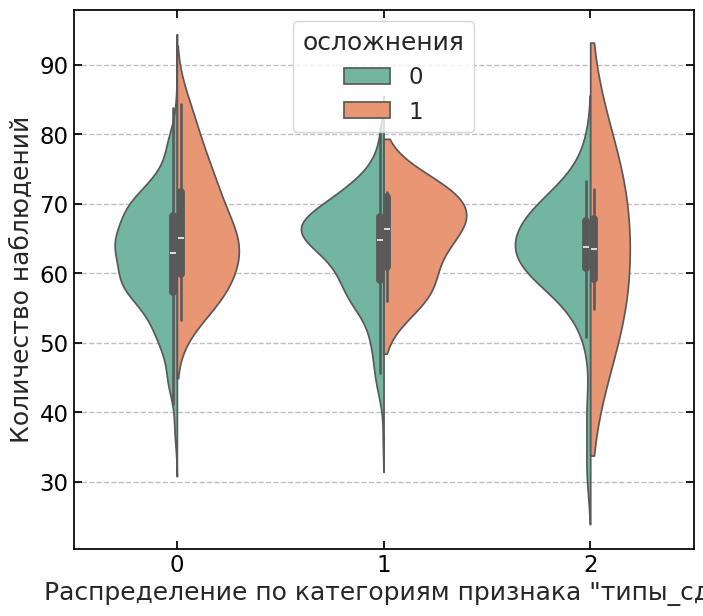

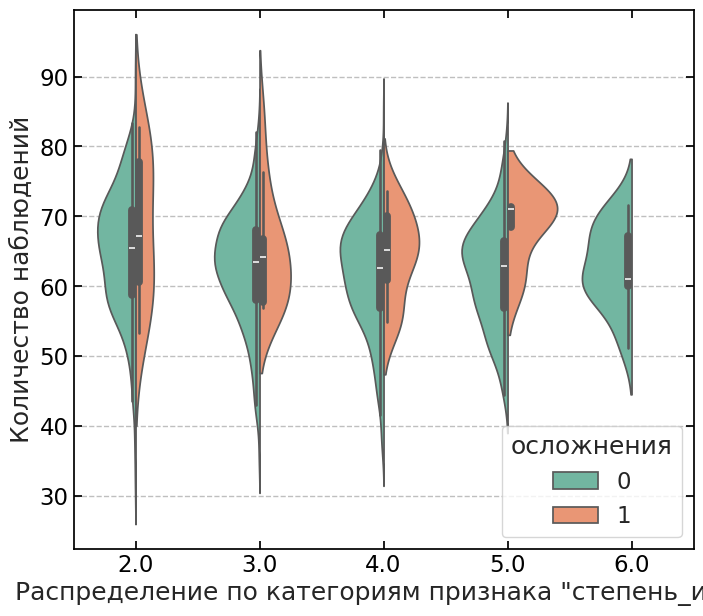

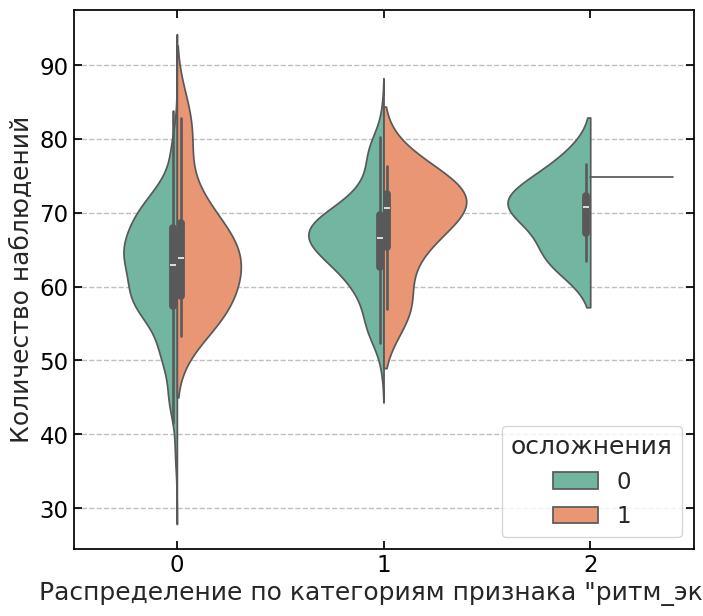

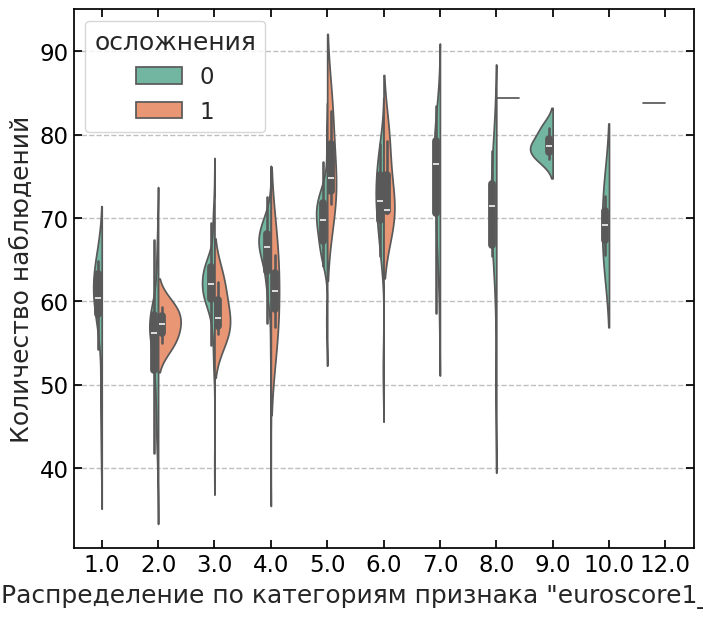

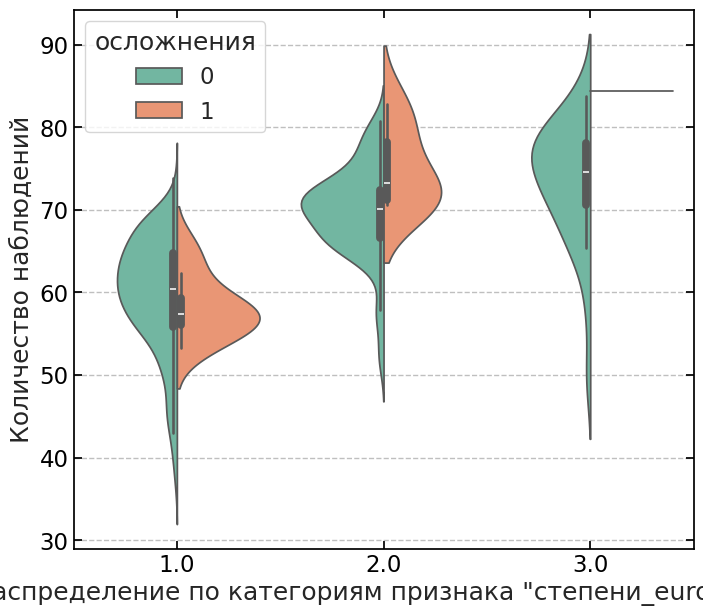

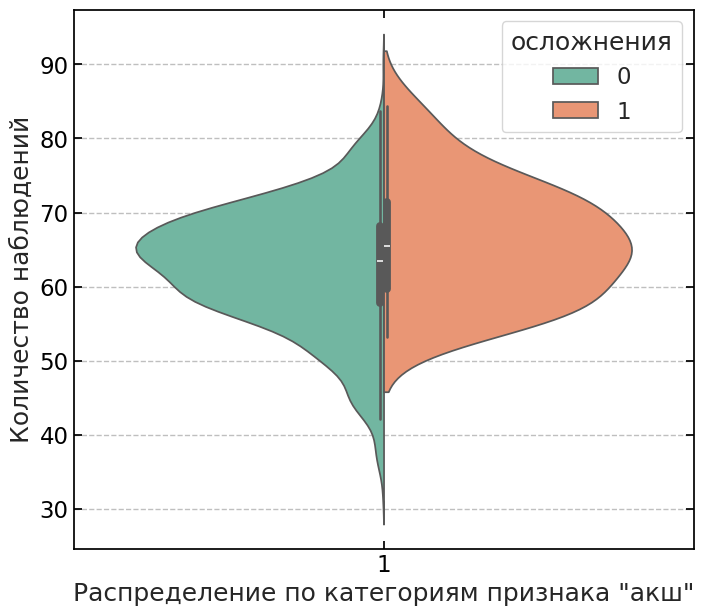

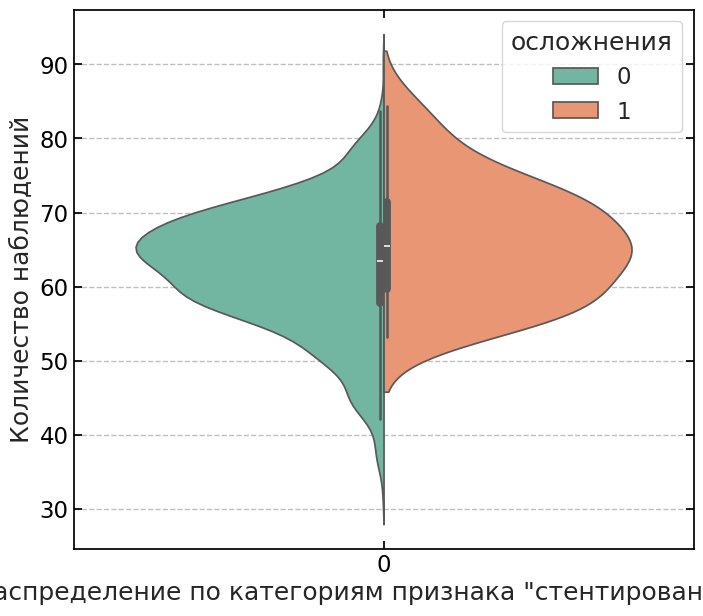

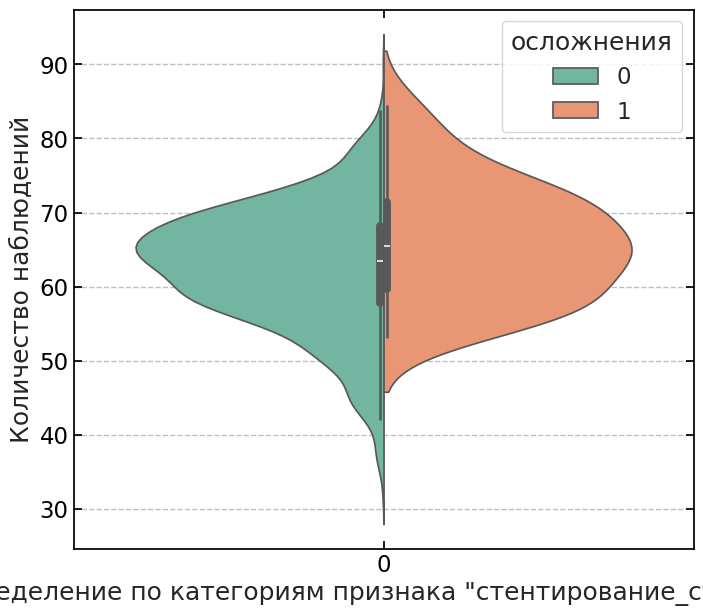

In [67]:
with sns.plotting_context("notebook", font_scale=1.5):
    for col in several_cat_cols:
        plt.figure(figsize=(8, 7))
        sns.violinplot(x=col, y='возраст', hue="осложнения",
                    data=df_train, palette="Set2", split=True);
        plt.ylabel('Количество наблюдений');
        plt.xlabel(f'Распределение по категориям признака "{col}"');

### Корреляционный анализ

In [68]:
from sklearn.impute import KNNImputer

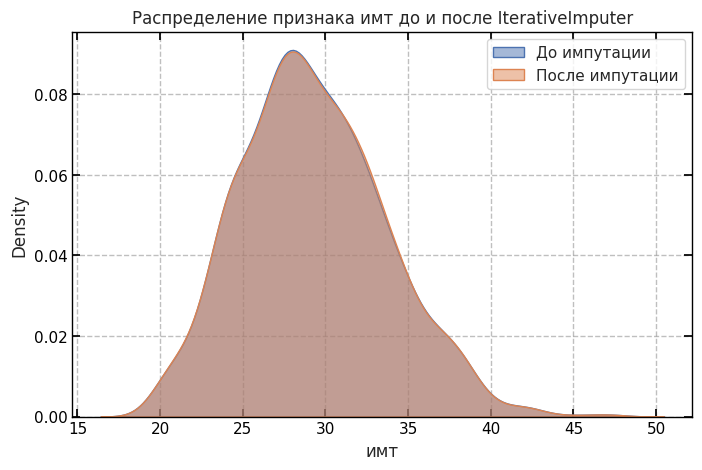

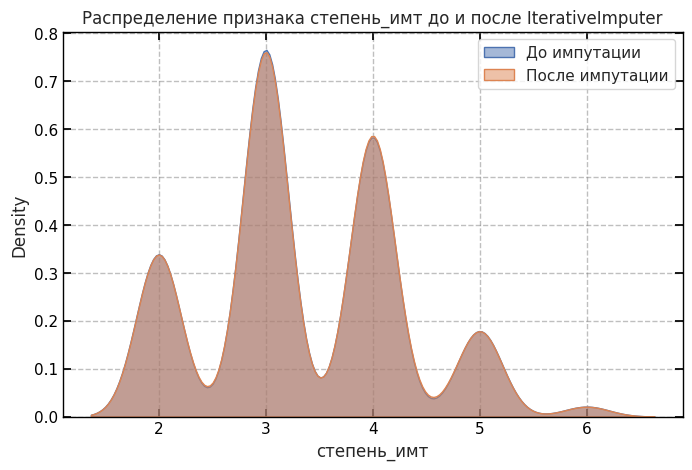

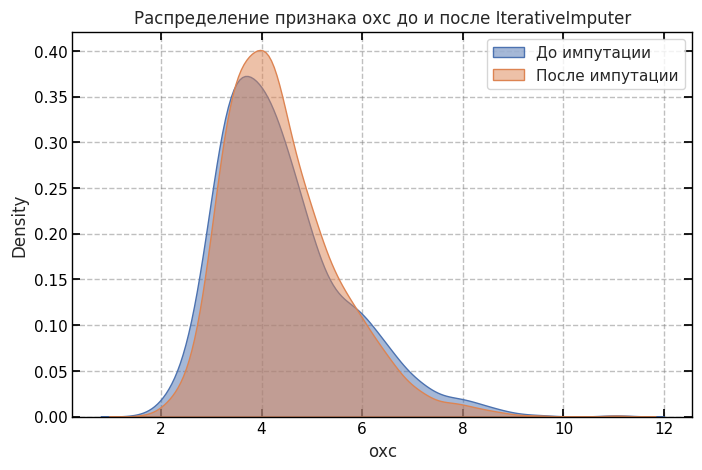

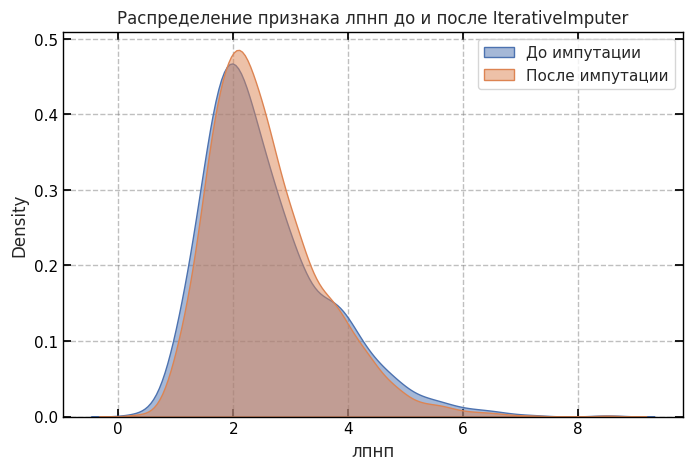

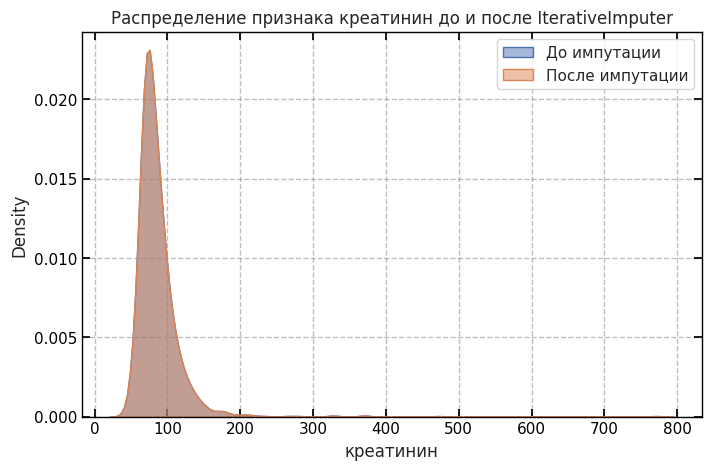

...

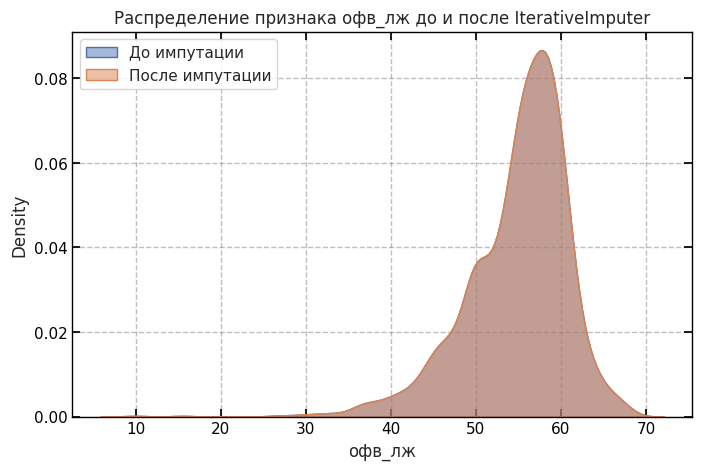

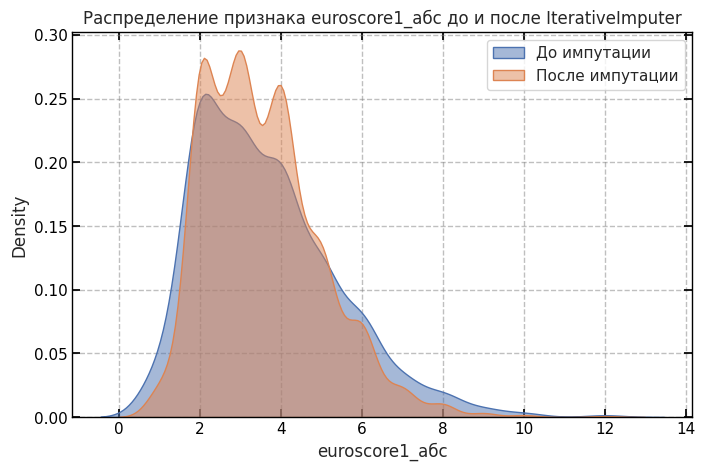

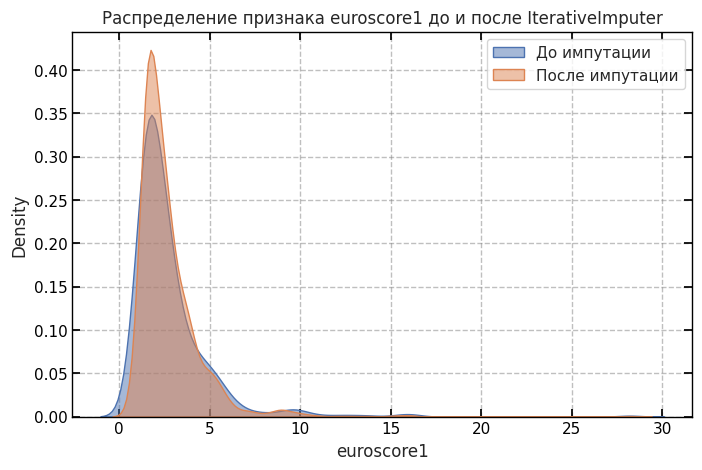

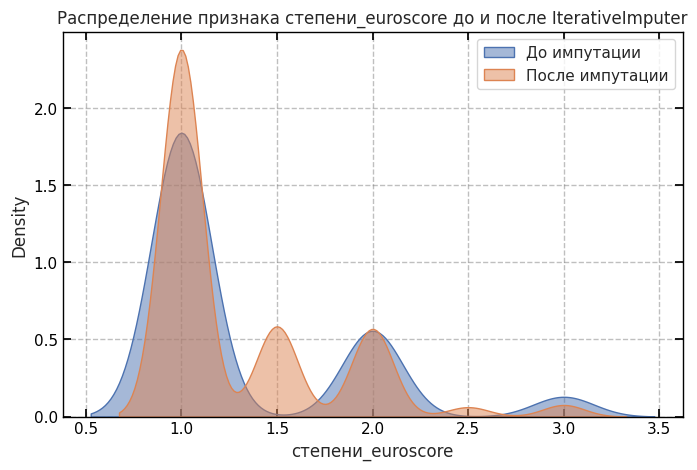

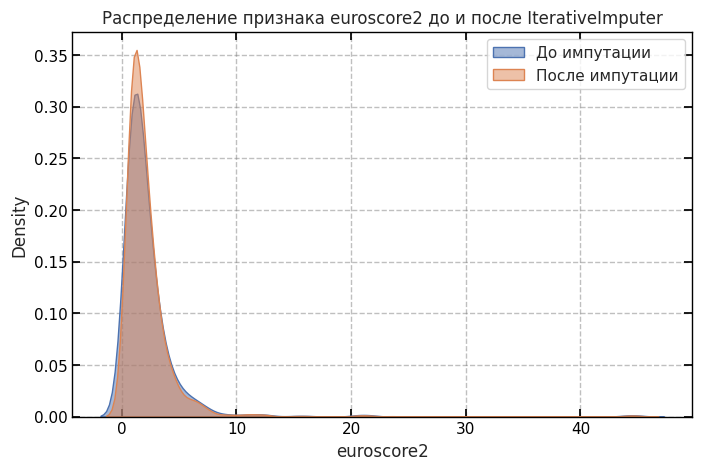

In [69]:
imp_features = df_nan_info.index
imputer = KNNImputer(n_neighbors=2,
                     weights='uniform',
                     metric='nan_euclidean')
df_imputed = pd.DataFrame(imputer.fit_transform(df_train[imp_features]),
                          columns=imp_features)

for feature in imp_features:
    original = df_train[feature].dropna()
    imputed = df_imputed[feature]

    plt.figure(figsize=(8,5))
    sns.kdeplot(original, label="До импутации", fill=True, alpha=0.5)
    sns.kdeplot(imputed, label="После импутации", fill=True, alpha=0.5)
    plt.legend()
    plt.title(f"Распределение признака {feature} до и после IterativeImputer")
    plt.show()


In [70]:
df_train_filled = (
    df_train.reset_index(drop=True)
    .drop(columns=imp_features, axis=1)
    .join(df_imputed.reset_index(drop=True))
)

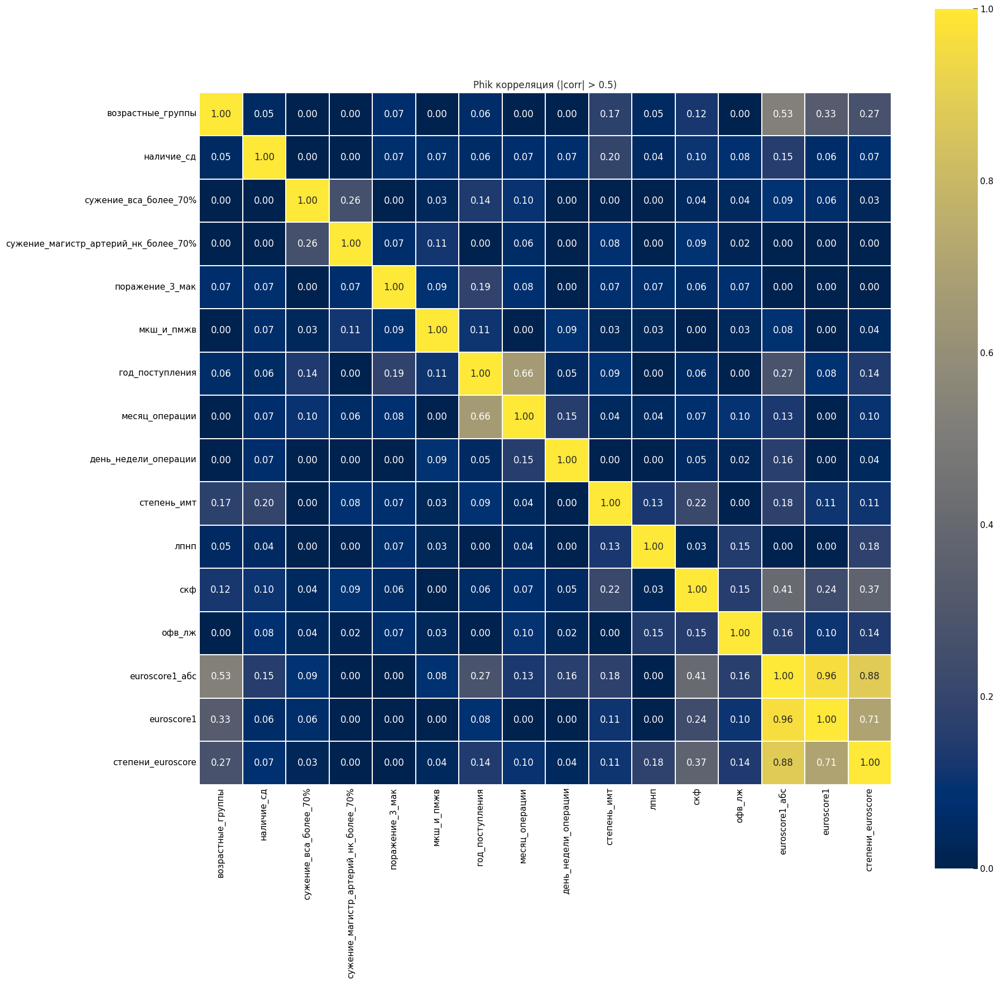

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

threshold = 0.5

# матрица phik
phik_corr = df_train_filled.phik_matrix(interval_cols=num_cols)

# берём нижний треугольник без диагонали
phik_no_diag = phik_corr.where(~np.triu(np.ones(phik_corr.shape, dtype=bool)))

# маска признаков, у которых есть хотя бы одна сильная корреляция в нижнем треугольнике
mask = (phik_no_diag.abs() > threshold).any(axis=1)

# фильтруем матрицу
phik_corr_filtered = phik_corr.loc[mask, mask]

plt.figure(figsize=(20, 20))
plt.title(f'Phik корреляция (|corr| > {threshold})')
sns.heatmap(phik_corr_filtered, annot=True, cmap='cividis',
            linewidth=0.1, fmt='.2f', square=True)
plt.show()


In [72]:
# threshold = 0.8
# mask = (phik_corr.abs() > threshold).any(axis=1)

# # фильтруем матрицу
# phik_corr_filtered = phik_corr.loc[mask, mask]

# plt.figure(figsize=(15, 15))
# plt.title(f'Phik корреляция (|corr| > {threshold})')
# sns.heatmap(phik_corr_filtered, annot=True, cmap='cividis',
#             linewidth=0.1, fmt='.2f', square=True)
# plt.show()

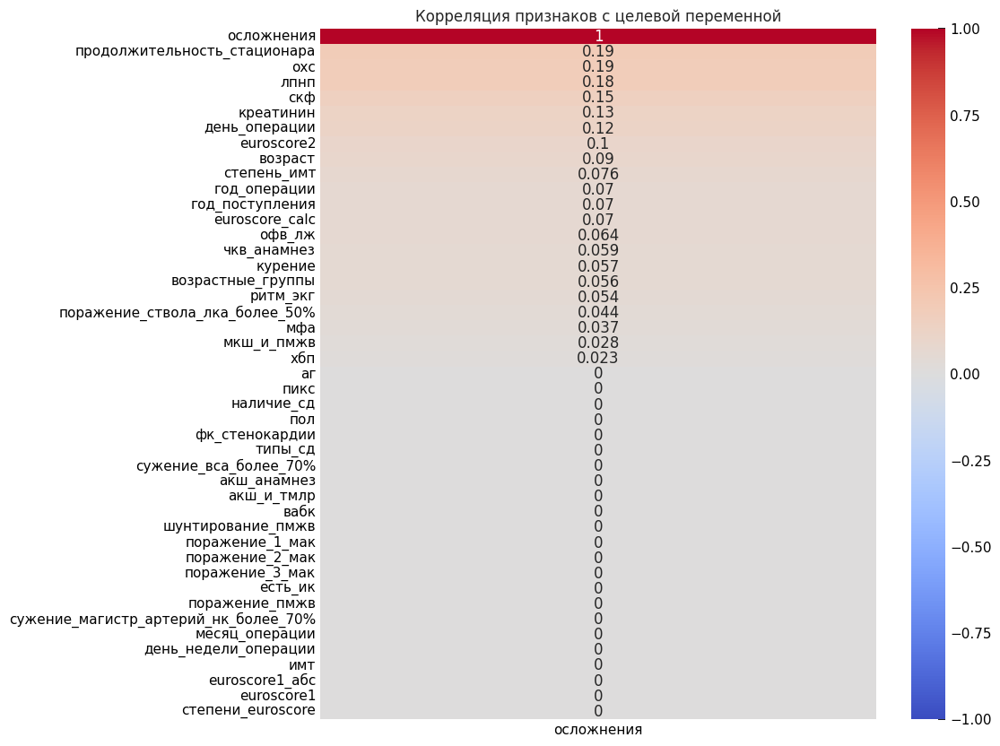

In [73]:
# строим тепловую карту
plt.figure(figsize=(10, 10))
sns.heatmap(
    phik_corr['осложнения'].to_frame().sort_values(by='осложнения', ascending=False),
    annot=True, cmap='coolwarm', vmin=-1, vmax=1
)
plt.title('Корреляция признаков с целевой переменной')
plt.show()

Корреляция у целевой переменной и одничными признаками практически отсутствует. Есть пары признаков сильно коррелирующие между собой, уберем один из празнаков для избежания мультиколлинеарности. В конечном наборе данных оставим только те признаки, которые подтвердили свою значимость в ходе проведенного исследования.

### Отбор признаков

In [74]:
num_cols

['возраст',
 'имт',
 'охс',
 'лпнп',
 'креатинин',
 'скф',
 'офв_лж',
 'еuroscore1',
 'euroscore2',
 'euroscore_calc']

In [75]:
several_cat_cols

['фк_стенокардии',
 'типы_сд',
 'степень_имт',
 'ритм_экг',
 'еuroscore1_абс',
 'степени_еuroscore',
 'акш',
 'стентирование_ка',
 'стентирование_ствола_лка']

In [120]:
time_cols
# time_cols = ['продолжительность_стационара',
#              'год_операции',
#              'месяц_операции',
#              'день_операции',
#              'день_недели_операции']

In [121]:
df_model = df_train.copy()
df_model = df_model[['возраст',
                     'имт',
                     'охс',
                     'креатинин',
                     'скф',
                     'офв_лж',
                     'euroscore_calc',
                     'пол',
                     'курение',
                     'хбп',
                     'чкв_анамнез',
                     'мфа',
                     'пикс',
                     'поражение_ствола_лка_более_50%',
                     'ритм_экг',
                     'осложнения'
                     ] + time_cols]

In [122]:
# time_cols.remove('день_операции')

In [123]:
df_model.shape

(1562, 21)

In [124]:
nums = ['возраст',
                     'имт',
                     'охс',
                     'креатинин',
                     'скф',
                     'офв_лж',
                    'день_операции',
                     'euroscore_calc']

In [125]:
# figsize = (20, 20)
# fig = plt.subplots(figsize=figsize)
# plt.title('Phik корреляция')
# sns.heatmap(df_model
#             .phik_matrix(interval_cols=nums),
#             annot=True, cmap='cividis',
#             linewidth=0.1,
#             fmt='.2f',
#             square=True)
# plt.show()

## Создание модели

In [126]:
X, y = df_model.drop(columns='осложнения', axis=1), df_model['осложнения']

Разделим выборку на обучающую и валидационную:

In [127]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y,
    stratify=y,
    test_size=0.2,
    random_state=RANDOM_STATE
)

Распределим признаки по типу:


In [128]:
ohe_cols = [
    'пол',
    'курение',
    'хбп',
    'чкв_анамнез',
    'мфа',
    'пикс',
    'поражение_ствола_лка_более_50%',
    'ритм_экг'
]
print("Номинальные категориальные признаки:", ohe_cols)

ord_cols = time_cols

print("Порядковые категориальные признаки:", ord_cols)

num_cols = X.select_dtypes(include=float).columns.tolist()
# num_cols.append('день_операции')
print("Количественные признаки:", num_cols)

Номинальные категориальные признаки: ['пол', 'курение', 'хбп', 'чкв_анамнез', 'мфа', 'пикс', 'поражение_ствола_лка_более_50%', 'ритм_экг']
Порядковые категориальные признаки: ['продолжительность_стационара', 'год_операции', 'месяц_операции', 'день_операции', 'день_недели_операции']
Количественные признаки: ['возраст', 'имт', 'охс', 'креатинин', 'скф', 'офв_лж', 'euroscore_calc']


In [129]:
ohe_pipe = Pipeline([

    (
        'ohe', OneHotEncoder(drop='first',
                             handle_unknown='ignore',
                             sparse_output=False)
    )
])

ord_pipe = Pipeline([

    (
        'ord', OrdinalEncoder(categories=[

                sorted(X_train[col].unique().tolist()) for col in ord_cols
        ])
    )
])

num_pipe = Pipeline([
   ('scaler', StandardScaler()),
   ('imputer', KNNImputer(n_neighbors=2,
                     weights='uniform',
                     metric='nan_euclidean')
   )

])

In [130]:
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_cols),
        ('ord', ord_pipe, ord_cols),
        ('num', num_pipe, num_cols)
    ],
    remainder='passthrough'
)

In [131]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, SVMSMOTE

In [132]:
pipeline = Pipeline([
    ('preprocessor', data_preprocessor),
    ('sampling', BorderlineSMOTE(random_state=RANDOM_STATE,
                                 sampling_strategy=0.3,
                                kind='borderline-2',
                                k_neighbors=3,
                                m_neighbors=10)),
    # ('under', TomekLinks(sampling_strategy='auto',
    #                      n_jobs=-1)),
    #  ('selector', SelectFromModel(RandomForestClassifier(
    #     n_estimators=100, random_state=RANDOM_STATE
    # ))),
    ('model', SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE))
])

In [133]:
from imblearn.over_sampling import ADASYN

In [134]:
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, BorderlineSMOTE, SVMSMOTE
from imblearn.under_sampling import RandomUnderSampler, NearMiss, TomekLinks
from imblearn.combine import SMOTETomek

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif, RFE, SelectFromModel
from sklearn.metrics import f1_score, make_scorer
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from lightgbm import LGBMClassifier







# samplers = {
#     'Без балансировки': None,
#     'SMOTE': SMOTE(random_state=RANDOM_STATE),
#     'BorderlineSMOTE': BorderlineSMOTE(random_state=RANDOM_STATE),
#     'SVMSMOTE': SVMSMOTE(random_state=RANDOM_STATE),
#     'SMOTE+TomekLinks': SMOTETomek(random_state=RANDOM_STATE),
#     'RandomUnderSampler': RandomUnderSampler(random_state=RANDOM_STATE),
#     'ADASYN': ADASYN(random_state=RANDOM_STATE, n_neighbors=5),
#     'TomekLinks': TomekLinks()
# }


# selectors = {
#     'Без отбора': 'passthrough',
#     'SelectKBest_ANOVA': SelectKBest(score_func=f_classif, k=10),
#     'SelectKBest_MI': SelectKBest(score_func=mutual_info_classif, k=10),
#     'RFE_SVC': RFE(SVC(kernel='linear', random_state=RANDOM_STATE), n_features_to_select=10),
#     'SelectFromModel_LGBM': SelectFromModel(LGBMClassifier(random_state=RANDOM_STATE), max_features=10)
# }


# models = {
#     'LogisticRegression': LogisticRegression(max_iter=1000, class_weight='balanced', random_state=RANDOM_STATE),
#     'SVC': SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE),
#     'KNeighbors': KNeighborsClassifier(n_neighbors=3),
#     'RandomForest': RandomForestClassifier(class_weight='balanced', random_state=RANDOM_STATE),
#     'CatBoost': CatBoostClassifier(random_state=RANDOM_STATE, early_stopping_rounds=20, verbose=0),
#     'LightGBM': LGBMClassifier(random_state=RANDOM_STATE),
# }


# cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=RANDOM_STATE)
# scorer = make_scorer(f1_score, average='macro')

# results = []
# best_f1 = -1
# best_model = None

# for model_name, model in models.items():
#     for sel_name, selector in selectors.items():
#         for samp_name, sampler in samplers.items():
#             print(f"\n Модель: {model_name} | Отбор: {sel_name} | Балансировка: {samp_name}")

#             if sampler is None:
#                 pipe = Pipeline([
#                     ('preprocessor', data_preprocessor),
#                     ('selector', selector),
#                     ('model', model)
#                 ])
#             else:
#                 pipe = Pipeline([
#                     ('preprocessor', data_preprocessor),
#                     ('sampler', sampler),
#                     ('selector', selector),
#                     ('model', model)
#                 ])


#             cv_scores = cross_val_score(pipe, X_train, y_train, cv=cv, scoring=scorer, n_jobs=-1)


#             pipe.fit(X_train, y_train)
#             y_val_pred = pipe.predict(X_val)
#             f1_val = f1_score(y_val, y_val_pred, average='macro')

#             print(f"CV F1: {cv_scores.mean():.3f} ± {cv_scores.std():.3f} | Val F1: {f1_val:.3f}")

#             results.append({
#                 'Model': model_name,
#                 'FeatureSelection': sel_name,
#                 'Resampling': samp_name,
#                 'F1_cv_mean': round(cv_scores.mean(), 3),
#                 'F1_cv_std': round(cv_scores.std(), 3),
#                 'F1_val': round(f1_val, 3)
#             })





# results_df = pd.DataFrame(results).sort_values(by='F1_val', ascending=False).reset_index(drop=True)
# display(results_df)

# print(f"\n Лучшая комбинация:")
# print(f"Модель: {results_df.iloc[0]['Model']}")
# print(f"Отбор признаков: {results_df.iloc[0]['FeatureSelection']}")
# print(f"Балансировка: {results_df.iloc[0]['Resampling']}")
# print(f"F1_val = {results_df.iloc[0]['F1_val']:.3f}")


In [135]:
# display(results_df.head(15))

### pipe

In [136]:
from sklearn.model_selection import learning_curve
import numpy as np
import matplotlib.pyplot as plt

def plot_learning_curve(pipe,
                        X_train,
                        y_train,
                        cv,
                        random_state=RANDOM_STATE):
    # Используем лучшие параметры
    best_model = pipe.best_estimator_

    # Вычисляем learning curve
    train_sizes, train_scores, val_scores = learning_curve(
        best_model,
        X_train, y_train,
        cv=cv,
        scoring="f1_macro",
        train_sizes=np.linspace(0.1, 1.0, 8),
        n_jobs=-1,
        random_state=RANDOM_STATE
    )

    # Считаем средние и стандартные отклонения
    train_mean = np.mean(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_std = np.std(val_scores, axis=1)

    # График
    plt.figure(figsize=(8,5))
    plt.plot(train_sizes, train_mean, 'o-', label="Train")
    plt.plot(train_sizes, val_mean, 'o-', label="Validation")
    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.2)
    plt.fill_between(train_sizes, val_mean - val_std, val_mean + val_std, alpha=0.2)
    plt.xlabel("Размер обучающей выборки")
    plt.ylabel("F1 macro")
    plt.title("Learning Curve для {type(pipe.best_estimator_.named_steps['model']).__name__}")
    plt.legend()
    plt.grid()
    plt.show()


In [137]:
model_results = []

def evaluate_model(pipe, name):

    if name != 'CatBoostClassifier':
        best_model = pipe.best_estimator_
    else:
        best_model = pipe['params']

    # предсказания
    y_pred_train = best_model.predict(X_train)
    y_pred_test = best_model.predict(X_val)

    # метрики
    model_results.append({
        'model': name,
        'cv_f1_macro': round(pipe.best_score_, 3),
        # 'train_f1_macro': round(f1_score(y_train, y_pred_train, average="macro"), 3),
        'val_f1_macro': round(f1_score(y_val, y_pred_test, average="macro"), 3),
        'diff_val_train': round(np.abs(
            pipe.best_score_ -
            f1_score(y_val, y_pred_test, average="macro")
        ), 3)
    })

    # # train report
    # print('Classification Report (train):')
    # print(classification_report(y_train, y_pred_train, digits=3))
    # cm_train = confusion_matrix(y_train, y_pred_train)
    # disp_train = ConfusionMatrixDisplay(confusion_matrix=cm_train)
    # disp_train.plot(cmap=plt.cm.Blues)
    # plt.title('Confusion Matrix на тренировочной выборке')
    # plt.show()

    # test report
    print('Classification Report (validation):')
    print(classification_report(y_val, y_pred_test, digits=3))
    cm_test = confusion_matrix(y_val, y_pred_test)
    disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
    disp_test.plot(cmap=plt.cm.Blues)
    plt.title('Confusion Matrix на валидационной выборке')
    plt.show()

### LogisticRegression

In [138]:
from sklearn.linear_model import Lasso
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import (accuracy_score,
                             f1_score,
                             classification_report,
                             confusion_matrix,
                             ConfusionMatrixDisplay)

Метрика f1 для лучшей модели:
 0.53


,rank_test_score,mean_test_score,std_test_score,params
14,1,0.525555,0.025377,"{'model__l1_ratio': 0.5, 'model__C': 0.7, 'model': LogisticRegression(class_weight='balanced', max_iter=1000, penalty='elasticnet', random_state=654321, solver='saga')}"
12,2,0.525008,0.025438,"{'model__l1_ratio': 1, 'model__C': 0.7, 'model': LogisticRegression(class_weight='balanced', max_iter=1000, penalty='elasticnet', random_state=654321, solver='saga')}"
15,2,0.525008,0.025438,"{'model__l1_ratio': 0.75, 'model__C': 1.0, 'model': LogisticRegression(class_weight='balanced', max_iter=1000, penalty='elasticnet', random_state=654321, solver='saga')}"
16,2,0.525008,0.025438,"{'model__l1_ratio': 1, 'model__C': 1.0, 'model': LogisticRegression(class_weight='balanced', max_iter=1000, penalty='elasticnet', random_state=654321, solver='saga')}"
17,5,0.519075,0.025317,"{'model__l1_ratio': 1, 'model__C': 0.1, 'model': LogisticRegression(class_weight='balanced', max_iter=1000, penalty='elasticnet', random_state=654321, solver='saga')}"


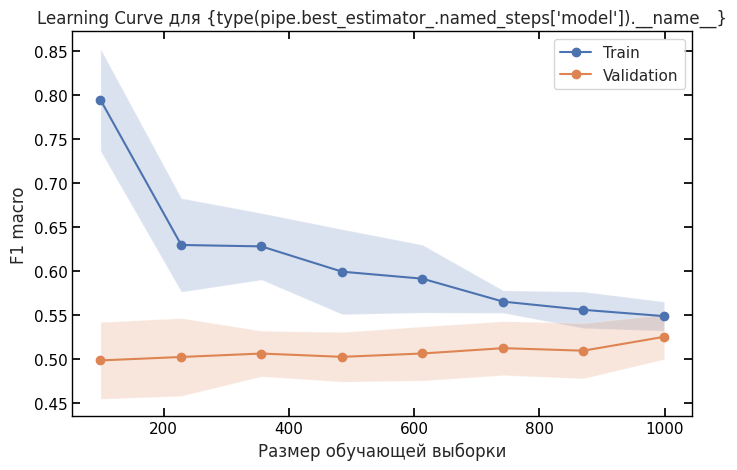

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.975     0.895     0.933       304
           1      0.059     0.222     0.093         9

    accuracy                          0.875       313
   macro avg      0.517     0.558     0.513       313
weighted avg      0.949     0.875     0.909       313



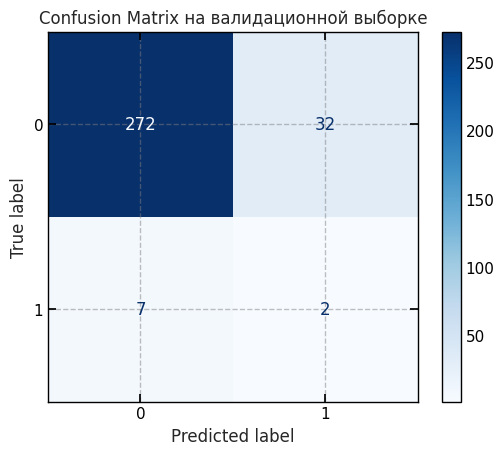

CPU times: user 2.48 s, sys: 72.5 ms, total: 2.55 s
Wall time: 58.9 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012


In [139]:
%%time
param_distributions  = [
    {
        'model': [LogisticRegression(random_state=RANDOM_STATE,
                                     class_weight='balanced',

                                     max_iter=1000,
                                     penalty='elasticnet',
                                     solver='saga')
                                     ],
        # 'sampling__sampling_strategy': [0.2, 0.3, 0.5],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 5],
        'model__l1_ratio': [0, 0.25, 0.5, 0.75, 1, 2, 5],
        'model__C': [0.1, 0.3, 0.5, 0.7, 1.0]
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_logit = RandomizedSearchCV(
    pipeline,
    param_distributions=param_distributions,
    cv=cv,
    scoring='f1_macro',
    random_state=RANDOM_STATE,
    n_jobs=-1,
    n_iter=20
)

rs_logit.fit(X_train, y_train)

print('Метрика f1 для лучшей модели:\n', round(rs_logit.best_score_, 2))
pd.set_option('display.max_colwidth', None)

result = pd.DataFrame(rs_logit.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','std_test_score', 'params']].head(5))
plot_learning_curve(rs_logit,
                    X_train, y_train,
                    cv)
evaluate_model(rs_logit, 'LogisticRegression')
df_results = pd.DataFrame(model_results)
df_results


### SVC

#### kernel=poly

,rank_test_score,mean_test_score,std_test_score,params
5,1,0.511838,0.029741,"{'model__gamma': 0.05, 'model__degree': 2, 'model__C': 0.5, 'model': SVC(class_weight='balanced', kernel='poly', probability=True, random_state=654321)}"
7,2,0.508613,0.024786,"{'model__gamma': 0.5, 'model__degree': 2, 'model__C': 0.01, 'model': SVC(class_weight='balanced', kernel='poly', probability=True, random_state=654321)}"
3,3,0.507248,0.023619,"{'model__gamma': 0.5, 'model__degree': 2, 'model__C': 0.05, 'model': SVC(class_weight='balanced', kernel='poly', probability=True, random_state=654321)}"
0,4,0.503633,0.025436,"{'model__gamma': 0.5, 'model__degree': 2, 'model__C': 0.5, 'model': SVC(class_weight='balanced', kernel='poly', probability=True, random_state=654321)}"
4,5,0.498042,0.020805,"{'model__gamma': 0.5, 'model__degree': 2, 'model__C': 1, 'model': SVC(class_weight='balanced', kernel='poly', probability=True, random_state=654321)}"


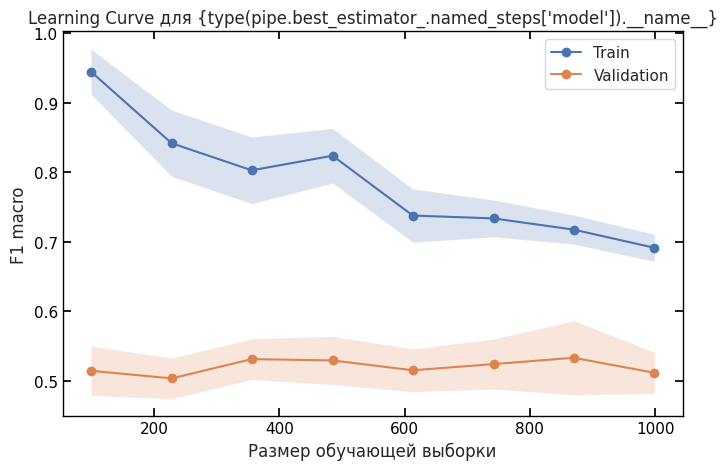

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.970     0.964     0.967       304
           1      0.000     0.000     0.000         9

    accuracy                          0.936       313
   macro avg      0.485     0.482     0.483       313
weighted avg      0.942     0.936     0.939       313



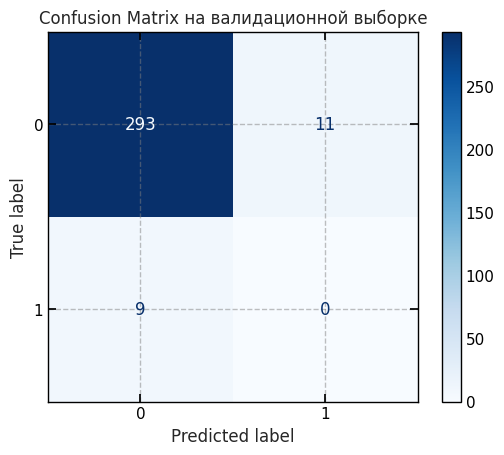

CPU times: user 2.33 s, sys: 112 ms, total: 2.44 s
Wall time: 1min 54s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028


In [140]:
%%time
param_grid = [
    {   # poly
        'model': [SVC(random_state=RANDOM_STATE,
                      kernel='poly',
                      class_weight='balanced',
                      probability=True)],
        # 'sampling__sampling_strategy': [0.2, 0.3, 0.4],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 5],
        'model__C': [0.01, 0.05, 0.1, 0.5, 1],
        'model__gamma': [0.01, 0.05, 0.1, 0.5],
        'model__degree': [2]

    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_svc_poly = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=10,
    random_state=RANDOM_STATE
)

rs_svc_poly.fit(X_train, y_train)

result = pd.DataFrame(rs_svc_poly.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','std_test_score', 'params']].head(5))

plot_learning_curve(rs_svc_poly,
                    X_train, y_train,
                    cv)

evaluate_model(rs_svc_poly, 'SVC_poly')
df_results = pd.DataFrame(model_results)
df_results

#### kernel=rbf

,rank_test_score,mean_test_score,std_test_score,params
4,1,0.518106,0.020926,"{'model__gamma': 0.01, 'model__C': 0.05, 'model': SVC(class_weight='balanced', probability=True, random_state=654321)}"
6,2,0.513834,0.027593,"{'model__gamma': 0.005, 'model__C': 0.1, 'model': SVC(class_weight='balanced', probability=True, random_state=654321)}"
9,3,0.507410,0.017641,"{'model__gamma': 0.005, 'model__C': 0.3, 'model': SVC(class_weight='balanced', probability=True, random_state=654321)}"
7,4,0.503974,0.013484,"{'model__gamma': 0.01, 'model__C': 0.1, 'model': SVC(class_weight='balanced', probability=True, random_state=654321)}"
8,5,0.503096,0.022489,"{'model__gamma': 0.05, 'model__C': 0.1, 'model': SVC(class_weight='balanced', probability=True, random_state=654321)}"


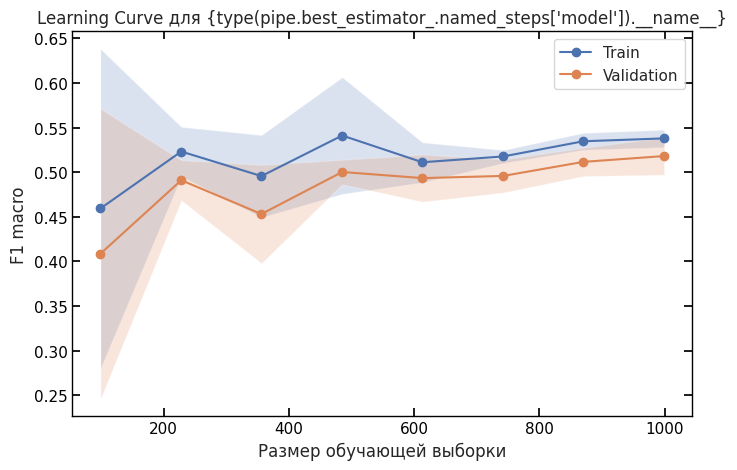

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.974     0.868     0.918       304
           1      0.048     0.222     0.078         9

    accuracy                          0.850       313
   macro avg      0.511     0.545     0.498       313
weighted avg      0.948     0.850     0.894       313



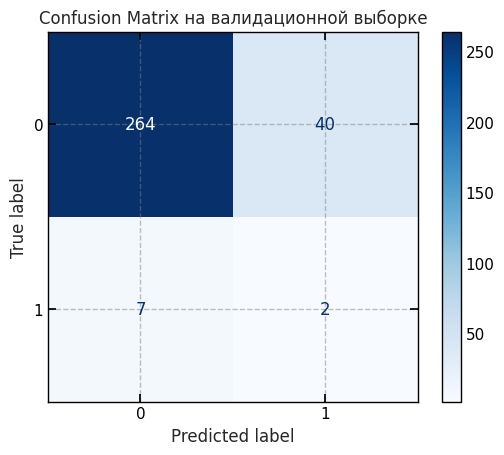

CPU times: user 2.08 s, sys: 45.9 ms, total: 2.13 s
Wall time: 31 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020


In [141]:
%%time
param_grid = [
    {   'model': [SVC(random_state=RANDOM_STATE,
                      kernel='rbf',
                      class_weight='balanced',
                      probability=True)],
        # 'sampling__sampling_strategy': [0.1, 0.2, 0.3],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 4],
        'model__C': [0.01, 0.05, 0.1, 0.3],
        'model__gamma': [0.005, 0.01, 0.05]
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_svc_rbf = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_svc_rbf.fit(X_train, y_train)

result = pd.DataFrame(rs_svc_rbf.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','std_test_score', 'params']].head(5))

plot_learning_curve(rs_svc_rbf,
                    X_train, y_train,
                    cv)

evaluate_model(rs_svc_rbf, 'SVC_rbf')
df_results = pd.DataFrame(model_results)
df_results

#### kernel=linear

,rank_test_score,mean_test_score,std_test_score,params
2,1,0.525923,0.029658,"{'model__C': 0.1285714285714286, 'model': SVC(class_weight='balanced', kernel='linear', probability=True, random_state=654321)}"
0,2,0.524118,0.027202,"{'model__C': 0.1, 'model': SVC(class_weight='balanced', kernel='linear', probability=True, random_state=654321)}"
1,2,0.524118,0.027202,"{'model__C': 0.1142857142857143, 'model': SVC(class_weight='balanced', kernel='linear', probability=True, random_state=654321)}"
6,4,0.517717,0.036312,"{'model__C': 0.18571428571428572, 'model': SVC(class_weight='balanced', kernel='linear', probability=True, random_state=654321)}"
7,5,0.517495,0.036583,"{'model__C': 0.2, 'model': SVC(class_weight='balanced', kernel='linear', probability=True, random_state=654321)}"


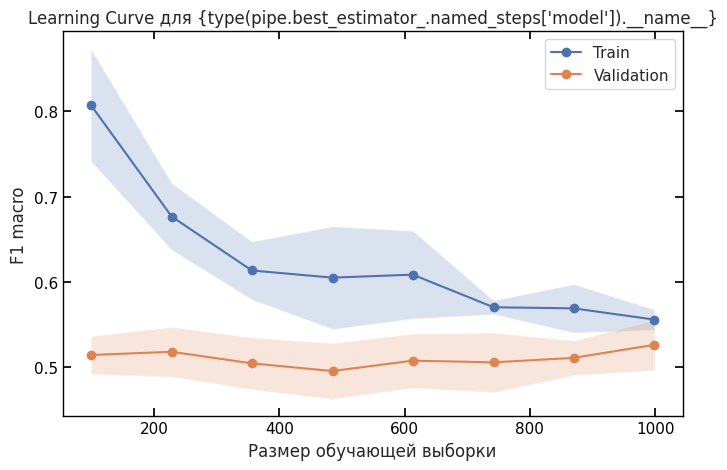

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.975     0.901     0.937       304
           1      0.062     0.222     0.098         9

    accuracy                          0.882       313
   macro avg      0.519     0.562     0.517       313
weighted avg      0.949     0.882     0.913       313



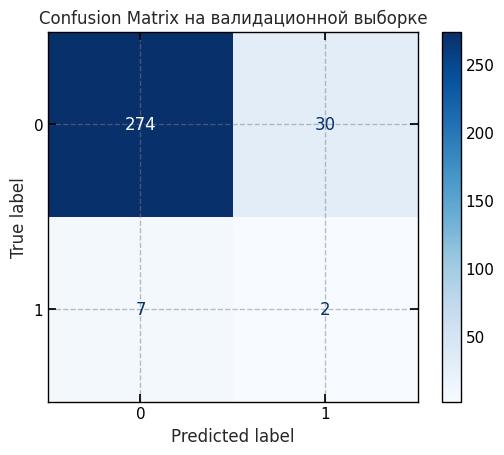

CPU times: user 1.7 s, sys: 34.9 ms, total: 1.74 s
Wall time: 16.7 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009


In [142]:
%%time
param_grid = [

    {   # linear
        'model': [SVC(random_state=RANDOM_STATE,
                      kernel='linear',
                      class_weight='balanced',
                      probability=True)],
        # 'sampling__sampling_strategy': [0.1, 0.2, 0.3],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 4],
        'model__C': np.linspace(0.1, 0.2, 8)
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_svc_linear = RandomizedSearchCV(
    pipeline,
    param_distributions=param_grid,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_svc_linear.fit(X_train, y_train)

result = pd.DataFrame(rs_svc_linear.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','std_test_score', 'params']].head(5))

plot_learning_curve(rs_svc_linear,
                    X_train, y_train,
                    cv)

evaluate_model(rs_svc_linear, 'SVC_linear')
df_results = pd.DataFrame(model_results)
df_results

### KNN

,rank_test_score,mean_test_score,params
3,1,0.505228,"{'model__weights': 'distance', 'model__n_neighbors': 2, 'model__metric': 'cityblock', 'model': KNeighborsClassifier()}"
12,2,0.504954,"{'model__weights': 'distance', 'model__n_neighbors': 7, 'model__metric': 'cityblock', 'model': KNeighborsClassifier()}"
0,3,0.504953,"{'model__weights': 'uniform', 'model__n_neighbors': 8, 'model__metric': 'cityblock', 'model': KNeighborsClassifier()}"
18,3,0.504953,"{'model__weights': 'distance', 'model__n_neighbors': 8, 'model__metric': 'cityblock', 'model': KNeighborsClassifier()}"
15,5,0.501645,"{'model__weights': 'uniform', 'model__n_neighbors': 9, 'model__metric': 'cityblock', 'model': KNeighborsClassifier()}"


None

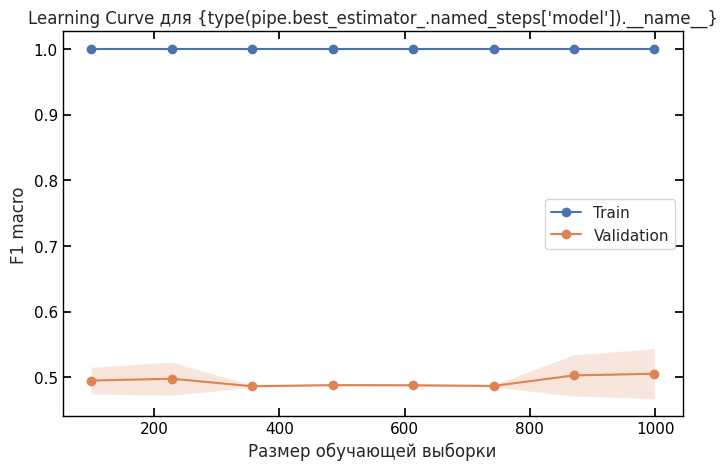

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.970     0.974     0.972       304
           1      0.000     0.000     0.000         9

    accuracy                          0.946       313
   macro avg      0.485     0.487     0.486       313
weighted avg      0.943     0.946     0.944       313



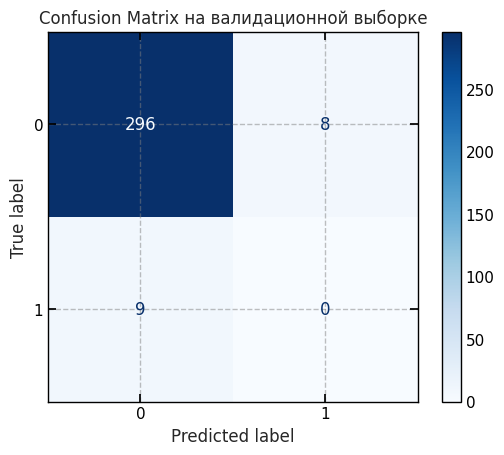

CPU times: user 1.66 s, sys: 33.8 ms, total: 1.69 s
Wall time: 12.4 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009
4,KNN,0.505,0.486,0.019


In [143]:

%%time
param_dist = [
    {
        'model': [KNeighborsClassifier()],
        # 'sampling__sampling_strategy': [0.1, 0.2, 0.3],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 4],
        'model__n_neighbors': range(2, 10),
        'model__weights': ['uniform', 'distance'],
        'model__metric': ['euclidean', 'cityblock']
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_knn = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_knn.fit(X_train, y_train)

result = pd.DataFrame(rs_knn.cv_results_).sort_values('rank_test_score')
display(display(result[['rank_test_score', 'mean_test_score','params']].head(5)))

plot_learning_curve(rs_knn,
                    X_train, y_train,
                    cv)

evaluate_model(rs_knn, 'KNN')
df_results = pd.DataFrame(model_results)
df_results

### RandomForest

,rank_test_score,mean_test_score,params
1,1,0.504344,"{'model__n_estimators': 100, 'model__min_samples_split': 20, 'model__min_samples_leaf': 16, 'model__max_samples': None, 'model__max_features': 'log2', 'model__max_depth': 3, 'model__criterion': 'gini', 'model': RandomForestClassifier(class_weight='balanced', random_state=654321)}"
0,2,0.491652,"{'model__n_estimators': 100, 'model__min_samples_split': 5, 'model__min_samples_leaf': 4, 'model__max_samples': None, 'model__max_features': 'sqrt', 'model__max_depth': 4, 'model__criterion': 'entropy', 'model': RandomForestClassifier(class_weight='balanced', random_state=654321)}"
7,2,0.491652,"{'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__min_samples_leaf': 4, 'model__max_samples': None, 'model__max_features': 'log2', 'model__max_depth': 4, 'model__criterion': 'entropy', 'model': RandomForestClassifier(class_weight='balanced', random_state=654321)}"
14,4,0.491447,"{'model__n_estimators': 100, 'model__min_samples_split': 5, 'model__min_samples_leaf': 8, 'model__max_samples': 0.6, 'model__max_features': 'log2', 'model__max_depth': 5, 'model__criterion': 'entropy', 'model': RandomForestClassifier(class_weight='balanced', random_state=654321)}"
18,5,0.491239,"{'model__n_estimators': 100, 'model__min_samples_split': 10, 'model__min_samples_leaf': 4, 'model__max_samples': 0.6, 'model__max_features': 'log2', 'model__max_depth': 4, 'model__criterion': 'gini', 'model': RandomForestClassifier(class_weight='balanced', random_state=654321)}"


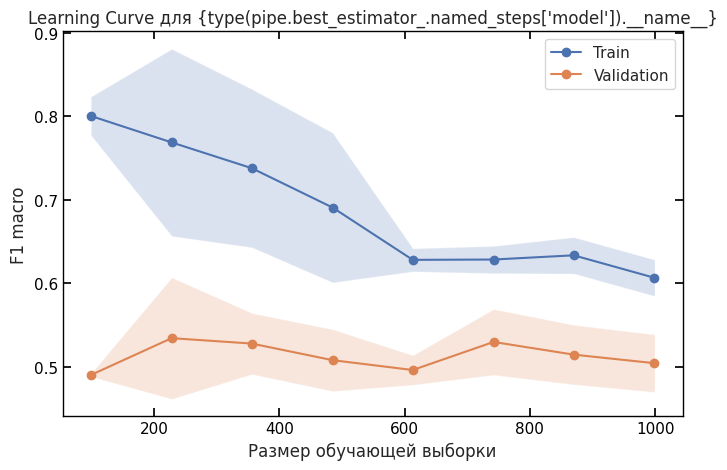

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.971     0.984     0.977       304
           1      0.000     0.000     0.000         9

    accuracy                          0.955       313
   macro avg      0.485     0.492     0.489       313
weighted avg      0.943     0.955     0.949       313



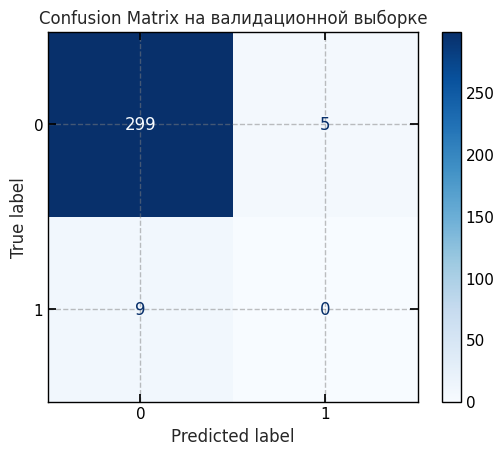

CPU times: user 2.14 s, sys: 67.4 ms, total: 2.21 s
Wall time: 42 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009
4,KNN,0.505,0.486,0.019
5,RandomForestClassifier,0.504,0.489,0.016


In [144]:
%%time
param_dist = [
    {
        'model': [RandomForestClassifier(random_state=RANDOM_STATE,
                                         class_weight='balanced',
                                         bootstrap=True)],
        # 'sampling__sampling_strategy': [0.1, 0.2, 0.3],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 4],
        'model__n_estimators': [100],
        'model__criterion': ['gini', 'entropy', 'log_loss'],
        'model__max_depth': [3, 4, 5],
        'model__min_samples_split': [5, 10, 20],
        'model__min_samples_leaf': [4, 8, 16],
        'model__max_features': ['sqrt', 'log2'],
        'model__max_samples': [0.6, 0.7, None]
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_rf = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_rf.fit(X_train, y_train)

result = pd.DataFrame(rs_rf.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','params']].head(5))

plot_learning_curve(rs_rf,
                    X_train, y_train,
                    cv)

evaluate_model(rs_rf, 'RandomForestClassifier')
df_results = pd.DataFrame(model_results)
df_results

### LightGBM

In [145]:
pipeline = Pipeline([
    # ('preprocessor', data_preprocessor),
    # ('sampling', BorderlineSMOTE(random_state=RANDOM_STATE)),
    ('model', SVC(kernel='rbf', class_weight='balanced', random_state=RANDOM_STATE))
])

,rank_test_score,mean_test_score,params
8,1,0.529042,"{'model__subsample': 0.5, 'model__reg_lambda': 1.0, 'model__reg_alpha': 0.5, 'model__num_leaves': 4, 'model__n_estimators': 300, 'model__min_child_samples': 40, 'model__max_depth': 3, 'model__learning_rate': 0.05, 'model__colsample_bytree': 0.8, 'model': LGBMClassifier(class_weight='balanced', random_state=654321, verbosity=-1)}"
18,2,0.523842,"{'model__subsample': 0.4, 'model__reg_lambda': 1.0, 'model__reg_alpha': 0.5, 'model__num_leaves': 4, 'model__n_estimators': 300, 'model__min_child_samples': 40, 'model__max_depth': 3, 'model__learning_rate': 0.05, 'model__colsample_bytree': 0.6, 'model': LGBMClassifier(class_weight='balanced', random_state=654321, verbosity=-1)}"
12,3,0.508832,"{'model__subsample': 0.4, 'model__reg_lambda': 2.0, 'model__reg_alpha': 2.0, 'model__num_leaves': 4, 'model__n_estimators': 500, 'model__min_child_samples': 40, 'model__max_depth': 4, 'model__learning_rate': 0.03, 'model__colsample_bytree': 0.8, 'model': LGBMClassifier(class_weight='balanced', random_state=654321, verbosity=-1)}"
5,4,0.508794,"{'model__subsample': 0.4, 'model__reg_lambda': 2.0, 'model__reg_alpha': 2.0, 'model__num_leaves': 8, 'model__n_estimators': 300, 'model__min_child_samples': 40, 'model__max_depth': 4, 'model__learning_rate': 0.03, 'model__colsample_bytree': 0.8, 'model': LGBMClassifier(class_weight='balanced', random_state=654321, verbosity=-1)}"
14,5,0.507242,"{'model__subsample': 0.5, 'model__reg_lambda': 1.0, 'model__reg_alpha': 1.0, 'model__num_leaves': 4, 'model__n_estimators': 500, 'model__min_child_samples': 40, 'model__max_depth': 4, 'model__learning_rate': 0.01, 'model__colsample_bytree': 0.8, 'model': LGBMClassifier(class_weight='balanced', random_state=654321, verbosity=-1)}"


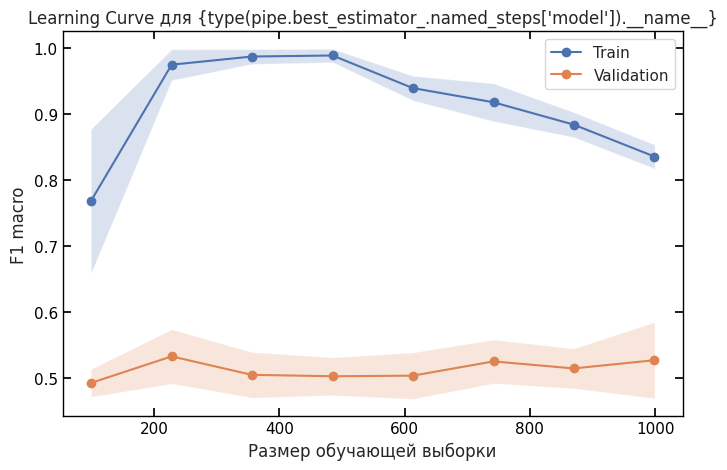

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.973     0.944     0.958       304
           1      0.056     0.111     0.074         9

    accuracy                          0.920       313
   macro avg      0.514     0.528     0.516       313
weighted avg      0.947     0.920     0.933       313



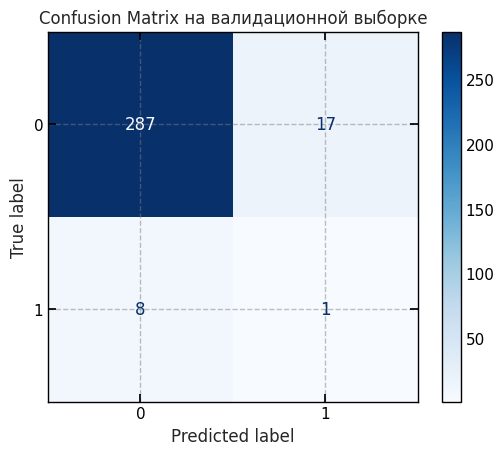

CPU times: user 1.24 s, sys: 45.1 ms, total: 1.28 s
Wall time: 17.1 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009
4,KNN,0.505,0.486,0.019
5,RandomForestClassifier,0.504,0.489,0.016
6,LGBMClassifier,0.529,0.516,0.013


In [146]:
%%time
param_dist = [
    {
        'model': [LGBMClassifier(
            random_state=RANDOM_STATE,
            class_weight='balanced',
            verbosity=-1
        )],
        # sampling — помягче
        # 'sampling__sampling_strategy': [0.15, 0.2],
        # 'sampling__kind': ['borderline-1'],
        # 'sampling__k_neighbors': [3, 5],

        # основные параметры модели
        'model__num_leaves': [4, 8],
        'model__max_depth': [3, 4],
        'model__learning_rate': [0.01, 0.03, 0.05],
        'model__n_estimators': [300, 500],
        'model__min_child_samples': [20, 40, 80],
        'model__subsample': [0.4, 0.5],
        'model__colsample_bytree': [0.6, 0.8],
        'model__reg_alpha': [0.5, 1.0, 2.0],
        'model__reg_lambda': [0.5, 1.0, 2.0]
    }
]



cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_lgbm = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_lgbm.fit(X_train, y_train)

result = pd.DataFrame(rs_lgbm.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','params']].head(5))

plot_learning_curve(rs_lgbm,
                    X_train, y_train,
                    cv)

evaluate_model(rs_lgbm, 'LGBMClassifier')
df_results = pd.DataFrame(model_results)
df_results

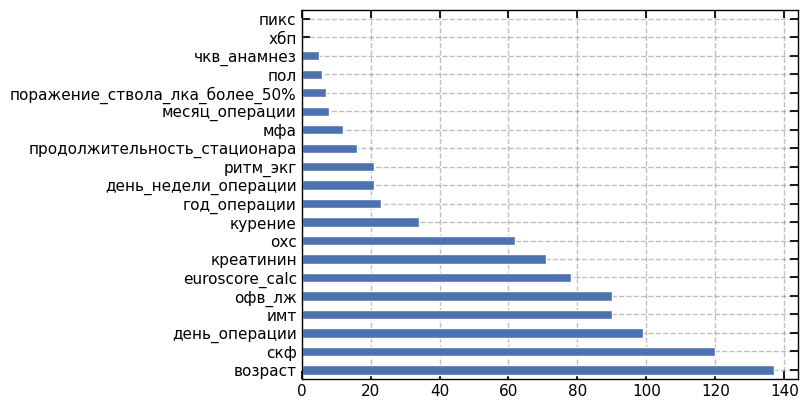

In [147]:
model = rs_lgbm.best_estimator_.named_steps['model']
importances = pd.Series(model.feature_importances_, index=X_train.columns)
importances.sort_values(ascending=False).head(20).plot(kind='barh')
plt.show()


### CatBoost


In [148]:
from catboost import CatBoostClassifier, Pool

In [149]:
%%time
train_pool = Pool(
    data=X_train,
    label=y_train,
    cat_features=ohe_cols + ord_cols
)

model = CatBoostClassifier(
    random_seed=RANDOM_STATE,
    eval_metric='TotalF1:average=Macro',
    early_stopping_rounds=20,
    logging_level='Silent',
    auto_class_weights='Balanced'

)


grid = {
    'depth': [3],
    'learning_rate': [0.1],
    'iterations': [200],
    'rsm': [0.5],
    # 'l2_leaf_reg': [4],
    # 'min_data_in_leaf': [40],
    'border_count': [128]
}


cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_cat_b = model.randomized_search(
    param_distributions=grid,
    X=train_pool,
    cv=cv,
    n_iter=20,
    partition_random_seed=RANDOM_STATE,
    calc_cv_statistics=True,
    verbose=False,
    plot=True
)

cv_results = pd.DataFrame(rs_cat_b['cv_results'])

best_f1_index = cv_results['test-TotalF1:average=Macro-mean'].idxmax()
best_f1_score = cv_results.loc[best_f1_index, 'test-TotalF1:average=Macro-mean']
best_f1_std = cv_results.loc[best_f1_index, 'test-TotalF1:average=Macro-std']

print('Лучшая модель:', rs_cat_b['params'])
print(f'Метрика F1 для лучшей модели: {best_f1_score:.3f} (±{best_f1_std:.3f})')

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Лучшая модель: {'border_count': 128, 'rsm': 0.5, 'depth': 3, 'learning_rate': 0.1, 'iterations': 200}
Метрика F1 для лучшей модели: 0.607 (±0.090)
CPU times: user 1.89 s, sys: 429 ms, total: 2.31 s
Wall time: 2.35 s


Classification Report (validation):
              precision    recall  f1-score   support

           0      0.974     0.987     0.980       304
           1      0.200     0.111     0.143         9

    accuracy                          0.962       313
   macro avg      0.587     0.549     0.562       313
weighted avg      0.952     0.962     0.956       313



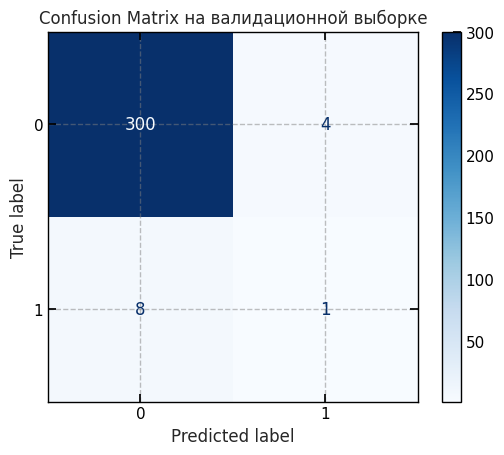

,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009
4,KNN,0.505,0.486,0.019
5,RandomForestClassifier,0.504,0.489,0.016
6,LGBMClassifier,0.529,0.516,0.013
7,CatBoostClassifier,0.607,0.562,0.397


In [150]:

best_params = rs_cat_b['params']

best_cat_model = CatBoostClassifier(
    **best_params,
    random_seed=RANDOM_STATE,
    eval_metric='TotalF1:average=Macro',
    early_stopping_rounds=20,
    logging_level='Silent',
    auto_class_weights='Balanced'
)

train_pool = Pool(data=X_train, label=y_train, cat_features=ohe_cols + ord_cols)
best_cat_model.fit(train_pool)

y_pred_train = best_cat_model.predict(X_train)
y_pred_val = best_cat_model.predict(X_val)

f1_train = f1_score(y_train, y_pred_train, average='macro')
f1_val = f1_score(y_val, y_pred_val, average='macro')

cv_results = pd.DataFrame(rs_cat_b['cv_results'])
# Находим колонку с макро F1 для теста
test_f1_col = [c for c in cv_results.columns if 'test-TotalF1:average=Macro' in c and '-mean' in c][0]
cv_f1 = cv_results[test_f1_col].max()

model_results.append({
    'model': 'CatBoostClassifier',
    'cv_f1_macro': round(cv_f1, 3),
    'val_f1_macro': round(f1_val, 3),
    'diff_val_train': round(abs(f1_train - f1_val), 3)
})

print('Classification Report (validation):')
print(classification_report(y_val, y_pred_val, digits=3))

cm_test = confusion_matrix(y_val, y_pred_val)
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test)
disp_test.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix на валидационной выборке')
plt.show()

df_results = pd.DataFrame(model_results)
df_results

### XGBClassifier

In [151]:
from xgboost import XGBClassifier

,rank_test_score,mean_test_score,params
0,1,0.521815,"{'model__subsample': 0.7, 'model__reg_lambda': 0, 'model__reg_alpha': 0.1, 'model__n_estimators': 100, 'model__min_child_weight': 3, 'model__max_depth': 4, 'model__gamma': 0.3, 'model__eta': 0.01, 'model__colsample_bytree': 0.8, 'model': XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=None, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=None, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=None, n_jobs=None, num_parallel_tree=None, ...)}"
1,2,0.518340,"{'model__subsample': 0.7, 'model__reg_lambda': 0.1, 'model__reg_alpha': 0, 'model__n_estimators': 100, 'model__min_child_weight': 5, 'model__max_depth': 3, 'model__gamma': 0.2, 'model__eta': 0.01, 'model__colsample_bytree': 0.8, 'model': XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=None, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=None, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=None, n_jobs=None, num_parallel_tree=None, ...)}"
18,3,0.518219,"{'model__subsample': 0.8, 'model__reg_lambda': 0.01, 'model__reg_alpha': 0.01, 'model__n_estimators': 300, 'model__min_child_weight': 2, 'model__max_depth': 4, 'model__gamma': 0.2, 'model__eta': 0.01, 'model__colsample_bytree': 0.7, 'model': XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=None, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=None, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=None, n_jobs=None, num_parallel_tree=None, ...)}"
14,4,0.514755,"{'model__subsample': 0.7, 'model__reg_lambda': 0, 'model__reg_alpha': 0, 'model__n_estimators': 100, 'model__min_child_weight': 3, 'model__max_depth': 2, 'model__gamma': 0.1, 'model__eta': 0.1, 'model__colsample_bytree': 0.8, 'model': XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, eval_metric=None, feature_types=None, feature_weights=None, gamma=None, grow_policy=None, importance_type=None, interaction_constraints=None, learning_rate=None, max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None, max_delta_step=None, max_depth=None, max_leaves=None, min_child_weight=None, missing=nan, monotone_constraints=None, multi_strategy=None, n_estimators=None, n_jobs=None, num_parallel_tree=None, ...)}"
10,5,0.511884,"{'model__subsample': 0.7, 'model__reg_lambda': 0.01, 'model__reg_alpha': 0.01, 'model__n_estimators': 100, 'model__min_child_weight': 2, 'model__max_depth': 2, 'model__gamma': 0.2, 'model__eta': 0.01, 'model__colsample_bytree': 0.7, 'model': XGBClassifier(base_score=None, booster=None, callbacks=None, colsample_bylevel=None, colsample_bynode=None, colsample_bytree=None, device=None, early_stopping_rounds=None, enable_categorical=False, ev

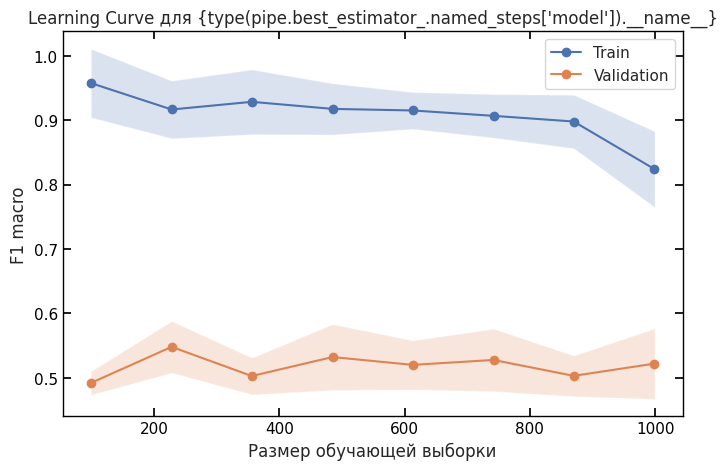

Classification Report (validation):
              precision    recall  f1-score   support

           0      0.976     0.931     0.953       304
           1      0.087     0.222     0.125         9

    accuracy                          0.911       313
   macro avg      0.531     0.577     0.539       313
weighted avg      0.950     0.911     0.929       313



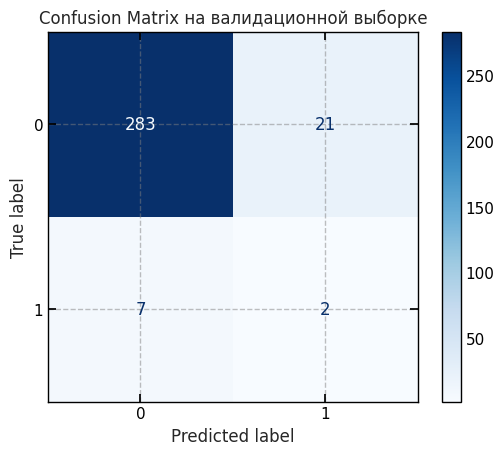

CPU times: user 1.68 s, sys: 33.2 ms, total: 1.71 s
Wall time: 17.2 s


,model,cv_f1_macro,val_f1_macro,diff_val_train
0,LogisticRegression,0.526,0.513,0.012
1,SVC_poly,0.512,0.483,0.028
2,SVC_rbf,0.518,0.498,0.020
3,SVC_linear,0.526,0.517,0.009
4,KNN,0.505,0.486,0.019
5,RandomForestClassifier,0.504,0.489,0.016
6,LGBMClassifier,0.529,0.516,0.013
7,CatBoostClassifier,0.607,0.562,0.397
8,XGBClassifier,0.522,0.539,0.017


In [152]:
%%time
from collections import Counter
counts = Counter(y_train)
scale_pos_weight = counts[0] / counts[1]

param_dist = [
    {
        'model': [XGBClassifier(
            random_state=RANDOM_STATE,
            scale_pos_weight=scale_pos_weight
        )],
        # 'sampling__sampling_strategy': [0.1, 0.2, 0.3],
        # 'sampling__kind': ['borderline-1', 'borderline-2'],
        # 'sampling__k_neighbors': [3, 4],

        'model__eta': [0.01, 0.05, 0.1],
        'model__gamma': [0, 0.1, 0.2, 0.3],
        'model__min_child_weight': [2, 3, 5],
        'model__n_estimators': [100, 200, 300],
        'model__max_depth': [2, 3, 4],
        'model__subsample': [0.7, 0.8],
        'model__colsample_bytree': [0.7, 0.8],
        'model__reg_alpha': [0, 0.01, 0.1],
        'model__reg_lambda': [0, 0.01, 0.1]
    }
]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

rs_xgb = RandomizedSearchCV(
    pipeline,
    param_distributions=param_dist,
    cv=cv,
    scoring='f1_macro',
    n_jobs=-1,
    n_iter=20,
    random_state=RANDOM_STATE
)

rs_xgb.fit(X_train, y_train)

result = pd.DataFrame(rs_xgb.cv_results_).sort_values('rank_test_score')
display(result[['rank_test_score', 'mean_test_score','params']].head(5))

plot_learning_curve(rs_xgb,
                    X_train, y_train,
                    cv)

evaluate_model(rs_xgb, 'XGBClassifier')
df_results = pd.DataFrame(model_results)
df_results

## Финальная модель

### Подготовка тестовой выборки

In [153]:
def prepare_features(df):


    # 2. Преобразование типов
    df['дата_поступления'] = pd.to_datetime(df['дата_поступления']).dt.tz_localize(None)

    # 3. Генерация новых признаков
    df['продолжительность_стационара'] = (df['дата_операции'] -
                                                df['дата_поступления']).dt.days
    df['год_операции'] = df['дата_операции'].dt.year
    df['месяц_операции'] = df['дата_операции'].dt.month
    df['день_операции'] = df['дата_операции'].dt.day
    df['день_недели_операции'] = df['дата_операции'].dt.weekday

    df['euroscore_calc'] = df.apply(calc_euroscore, axis=1)

    # 5. (Опционально) оставить только нужные признаки
    selected_features = X_train.columns.tolist()
    df = df[selected_features]

    return df


In [154]:
X_test = prepare_features(df_test)

In [155]:
y_test = df_test['осложнения']

### test

In [156]:
best_model = rs_svc_linear.best_estimator_

y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

print('Classification Report:')
print(classification_report(y_test, y_pred, digits=3))



Classification Report:
              precision    recall  f1-score   support

           0      0.980     0.906     0.942       652
           1      0.090     0.333     0.141        18

    accuracy                          0.891       670
   macro avg      0.535     0.620     0.542       670
weighted avg      0.956     0.891     0.920       670



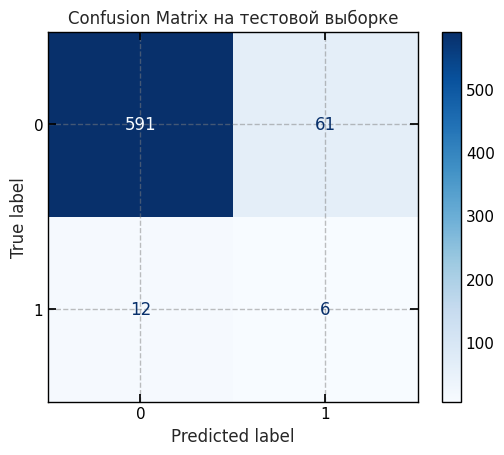

In [157]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix на тестовой выборке')
plt.show()

### Подбор порога

In [160]:
from sklearn.metrics import precision_recall_curve,precision_score,recall_score

In [161]:
thresholds = np.linspace(0, 1, 100)

precisions = []
recalls = []
f1_scores = []

for t in thresholds:
    predicted = (y_pred_proba > t).astype(int)
    precisions.append(precision_score(y_test, predicted))
    recalls.append(recall_score(y_test, predicted))
    f1_scores.append(f1_score(y_test, predicted, average='macro'))

max_f1_idx = np.argmax(f1_scores)
max_prec_idx = np.argmax(precisions)
max_rec_idx = np.argmax(recalls)

best_threshold_f1 = thresholds[max_f1_idx]
best_threshold_prec = thresholds[max_prec_idx]
best_threshold_rec = thresholds[max_rec_idx]

results_df = pd.DataFrame({
    'Метрика': ['F1_macro', 'Precision', 'Recall'],
    'Лучший порог': [best_threshold_f1, best_threshold_prec, best_threshold_rec],
    'Значение метрики': [
        f1_scores[max_f1_idx],
        precisions[max_prec_idx],
        recalls[max_rec_idx]
    ]
})

print("Таблица с результатами порогов:")
display(results_df)


Таблица с результатами порогов:


,Метрика,Лучший порог,Значение метрики
0,F1_macro,0.393939,0.562030
1,Precision,0.838384,0.333333
2,Recall,0.000000,1.000000


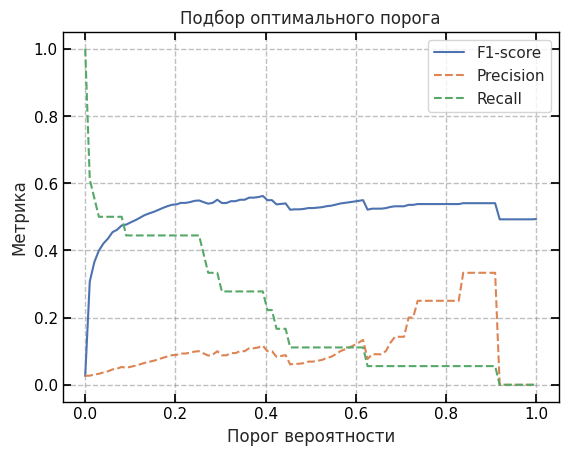

In [162]:
import matplotlib.pyplot as plt

plt.plot(thresholds, f1_scores, label='F1-score')
plt.plot(thresholds, precisions, '--', label='Precision')
plt.plot(thresholds, recalls, '--', label='Recall')
plt.xlabel("Порог вероятности")
plt.ylabel("Метрика")
plt.title("Подбор оптимального порога")
plt.legend()
plt.grid(True)
plt.show()


In [163]:
def plot_confusion_matrix(y_test, y_pred_opt, threshold):

    print(f"\nClassification report (threshold = {threshold}):")
    print(classification_report(y_test, y_pred_opt, digits=3))

    cm = confusion_matrix(y_test, y_pred_opt)

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[0, 1])
    disp.plot(cmap='Blues', values_format='d')
    plt.title(f'Confusion Matrix (threshold = {threshold:.3f})')
    plt.show()

    cm = confusion_matrix(y_test, y_pred_opt)


Classification report (threshold = 0.394):
              precision    recall  f1-score   support

           0      0.979     0.942     0.960       652
           1      0.116     0.278     0.164        18

    accuracy                          0.924       670
   macro avg      0.548     0.610     0.562       670
weighted avg      0.956     0.924     0.939       670



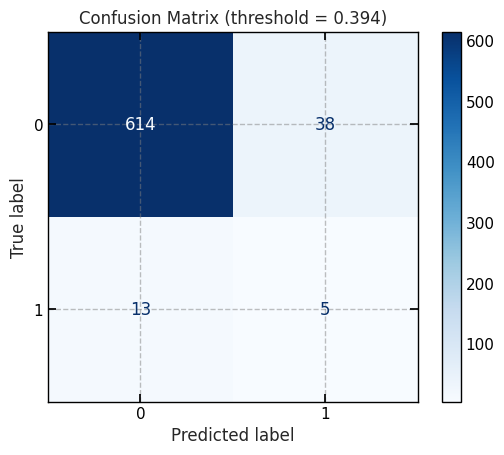


Classification report (threshold = 0.2):
              precision    recall  f1-score   support

           0      0.983     0.874     0.925       652
           1      0.089     0.444     0.148        18

    accuracy                          0.863       670
   macro avg      0.536     0.659     0.537       670
weighted avg      0.959     0.863     0.904       670



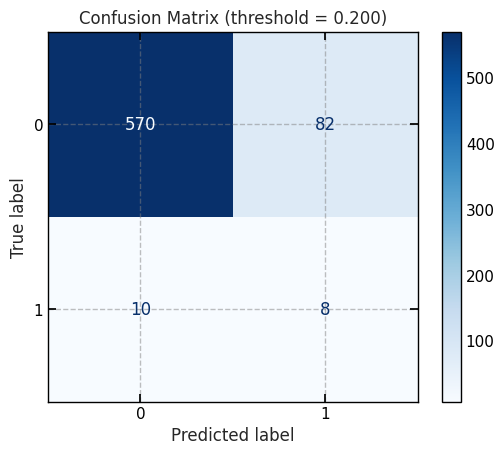


Classification report (threshold = 0.6):
              precision    recall  f1-score   support

           0      0.975     0.977     0.976       652
           1      0.118     0.111     0.114        18

    accuracy                          0.954       670
   macro avg      0.547     0.544     0.545       670
weighted avg      0.952     0.954     0.953       670



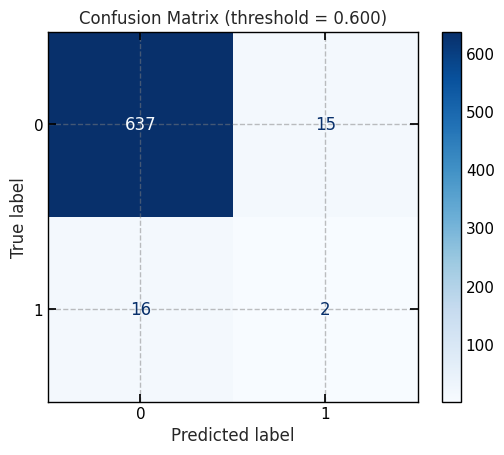

In [164]:
thresholds = [0.394, 0.2, 0.6]

for threshold in thresholds:
    y_pred_opt = (y_pred_proba >= threshold).astype(int)
    plot_confusion_matrix(y_test, y_pred_opt, threshold)




